In [1]:
import scanpy as sc
import pandas as pd
import os
import matplotlib as plt
import anndata as ad

In [ ]:
sc.set_figure_params(dpi = 300)

In [3]:
adata = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet.h5ad")

In [4]:
adata = adata[adata.obs['batch'] != '20230925'].copy()

In [6]:
import pandas as pd
import numpy as np

# 1) Column name sanity (your printout shows underscores, not a space)
b_leiden_col = "leiden_res_100.00_neuron"   # not "leiden_res_100.00 neuron"

# 2) Grab barcodes (from bdata.obs['sample']) for cluster '133'
mask_b = (bdata.obs[b_leiden_col].astype(str) == "133")
barcodes_133 = set(bdata.obs.loc[mask_b, "sample"])

# 3) Find those cells in adata by matching adata.obs['sample']
mask_a = adata.obs["sample"].isin(barcodes_133)

# 4) Prepare all_celltype for assignment (handle categoricals)
if "all_celltype" not in adata.obs.columns:
    adata.obs["all_celltype"] = pd.Series(index=adata.obs_names, dtype="object")

if pd.api.types.is_categorical_dtype(adata.obs["all_celltype"]):
    if "100-133" not in adata.obs["all_celltype"].cat.categories:
        adata.obs["all_celltype"] = adata.obs["all_celltype"].cat.add_categories(["100-133"])

# 5) Assign the label
adata.obs.loc[mask_a, "all_celltype"] = "100-133"

# 6) (Optional) report how many were labeled
n_labeled = int(mask_a.sum())
print(f"Labeled {n_labeled} cells in adata.obs['all_celltype'] as '100-133'.")


Labeled 769 cells in adata.obs['all_celltype'] as '100-133'.


/tmp/ipykernel_32793/1560357267.py:18: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(adata.obs["all_celltype"]):


In [7]:
# ============================================================
# Combined figure (3 pseudo-bulk rows + heatmaps)
# - Row A: TRUE bulk-like per-replicate (ALL cell types), mean±SD
# - Row B: TRUE bulk-like per-replicate (CLOCK-ONLY red set), mean±SD
# - Row C: TRUE bulk-like per-replicate (NON-CLOCK set), mean±SD
# - Row D: Cell-type heatmaps with low-coverage masking + zero->NaN
# ============================================================

import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib.lines import Line2D
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

# ----------------------------
# USER SETTINGS
# ----------------------------
clock_genes = [
    'Clk',
    #'cry',
    'cwo','per','tim','vri','Pdp1',
#    'Slob','Achl','NfI',
#    'Usp8','Pka-R1',
    #'Best1',
    #'dl','Zw','to','Gclc',
    #'ap','trpl','ninaA',
    #'Hk',
    #'Ih',
    #'Picot','hoe1',
    #'VAChT',
    
]

# Cell types marked as "clock oscillating" (red) for heatmap + Row B pooling
desired_celltypes = [
    "FAT-1","FAT-2","HE","ALG","CHG",
    "PNG","SPG","CG","EG","LEMG","CONE-1","CONE-2",
    "R1-6","R7","R8","CLKN","KCy","PGM","DRA","OCR","T1","EPI", 
]

celltype_col   = 'all_celltype'
time_col       = 'final_Conditions'   # e.g., "WT_ZT0_1", "MT_CT12_2"
layer          = 'counts'
scale_factor   = 1_000_000
exclude_times  = {'CT28'}
# Temporarily exclude these cell types from heatmaps and clock/non-clock rows
exclude_celltypes = {'Unannotated'}   # set() to include again
# Also exclude from Row A (ALL) if you want:
exclude_from_all = False              # True -> remove from ALL row too

# Heatmap
vmin, vmax = -2, 2
cmap = sns.color_palette("RdYlBu_r", as_cmap=True)
cmap.set_bad('lightgray')

# Coverage/zeros handling for heatmaps
min_cells   = 20        # gray-out threshold
zero_policy = 'na'      # treat log1p(CPM)==0 as NaN pre-zscore
z_fill      = None      # keep NaNs gray

# ----------------------------
# HELPERS
# ----------------------------
def _extract_gt_time_rep(s):
    m_g = re.search(r'(WT|MT)', s)
    m_t = re.search(r'(ZT|CT)\d+', s)
    m_r = re.search(r'(?:ZT|CT)\d+_(\d+)', s)
    g = m_g.group(1) if m_g else np.nan
    t = m_t.group(0) if m_t else np.nan
    r = m_r.group(1) if m_r else None
    return g, t, r

def build_col_order_from_available(idx_multi, exclude_times=()):
    all_times = {i[2] for i in idx_multi}
    kept = [t for t in all_times if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)', s); grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    times_sorted = sorted(kept, key=keyfun)
    return [('WT', t) for t in times_sorted] + [('MT', t) for t in times_sorted]

def tuples_to_names(tuples):
    return [f"{g}_{t}" for (g, t) in tuples]

def parse_colname(cname):
    g, t = cname.split('_'); m = re.match(r'(ZT|CT)(\d+)', t)
    return g, m.group(1), int(m.group(2))

def shade_background(ax, colnames):
    for idx_c, cname in enumerate(colnames):
        g, tt, hr = parse_colname(cname)
        if tt == 'ZT':
            if 0 <= hr < 12: ax.axvspan(idx_c-0.5, idx_c+0.5, color='yellow', alpha=0.20)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)
        else:
            if 0 <= hr <= 8: ax.axvspan(idx_c-0.5, idx_c+0.5, color='lightgray', alpha=0.30)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)

def local_row_z(mat_df):
    mu = mat_df.mean(axis=1, skipna=True)
    sd = mat_df.std(axis=1, skipna=True).replace(0, np.nan)
    return mat_df.sub(mu, axis=0).div(sd, axis=0)

def slice_gene_heat_matrix(log1p_mat, gene, col_order):
    s = log1p_mat.loc[gene]
    idx = log1p_mat.columns
    tmp = pd.DataFrame({
        'celltype':[i[0] for i in idx],
        'genotype':[i[1] for i in idx],
        'time_point':[i[2] for i in idx],
        'value':s.values
    })
    tmp['colkey'] = list(zip(tmp['genotype'], tmp['time_point']))
    heat = tmp.pivot(index='celltype', columns='colkey', values='value')
    return heat.reindex(columns=col_order)

# ----------------------------
# CORE SUMMARIES
# ----------------------------
def pseudobulk_log1p_cpm(adata, genes, celltype_col, time_col, layer='counts',
                         scale_factor=1_000_000, exclude_times=(), exclude_celltypes=()):
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    var = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    key_df = pd.DataFrame({celltype_col: adata.obs[celltype_col].astype(str).values,
                           'genotype': gt, 'time_point': tp})
    valid = key_df['genotype'].notna() & key_df['time_point'].notna()
    if exclude_times:
        valid &= ~key_df['time_point'].isin(exclude_times)
    # NEW: drop excluded cell types
    if exclude_celltypes:
        valid &= ~key_df[celltype_col].astype(str).isin(set(exclude_celltypes))
    key_df = key_df.loc[valid]; X = X[valid.values, :]

    grouped = key_df.groupby([celltype_col, 'genotype', 'time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in grouped.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    agg = pd.DataFrame(np.vstack(sums), columns=var,
                       index=pd.MultiIndex.from_tuples(cols, names=[celltype_col,'genotype','time_point'])).T
    genes_use = [g for g in genes if g in agg.index]
    agg = agg.loc[genes_use]

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

def bulk_like_log1p_cpm_by_rep(adata, layer, time_col, scale=1_000_000,
                               exclude_times=(), celltype_col=None, keep_celltypes=None):
    """
    TRUE BULK per replicate with optional cell-type filtering.
    Returns: DataFrame genes x MultiIndex(genotype,time_point,replicate)
    """
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    genes = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    parsed = tser.apply(_extract_gt_time_rep)
    meta = pd.DataFrame(parsed.tolist(), columns=['genotype','time_point','replicate'])
    if celltype_col is not None:
        meta[celltype_col] = adata.obs[celltype_col].astype(str).values

    valid = meta['genotype'].notna() & meta['time_point'].notna()
    if exclude_times: valid &= ~meta['time_point'].isin(exclude_times)
    if keep_celltypes is not None and celltype_col is not None:
        keep = pd.Index(keep_celltypes).astype(str)
        valid &= meta[celltype_col].isin(keep)

    X = X[valid.values, :]; meta = meta.loc[valid]

    groups = meta.groupby(['genotype','time_point','replicate'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    if not sums:
        return pd.DataFrame(index=genes)

    agg = pd.DataFrame(np.vstack(sums), columns=genes,
                       index=pd.MultiIndex.from_tuples(cols, names=['genotype','time_point','replicate'])).T

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale
    return np.log1p(cpm)

# ----------------------------
# BUILD MATRICES FOR HEATMAPS
# ----------------------------
log1p_mat = pseudobulk_log1p_cpm(
    adata, genes=clock_genes, celltype_col=celltype_col, time_col=time_col,
    layer=layer, scale_factor=scale_factor, exclude_times=exclude_times,
    exclude_celltypes=exclude_celltypes   # <--- add this
)

col_order  = build_col_order_from_available(log1p_mat.columns, exclude_times=exclude_times)
colnames   = tuples_to_names(col_order)

# ----------------------------
# PARTITIONS FOR THE THREE PSEUDO-BULK ROWS
# ----------------------------
all_cts = pd.Index(adata.obs[celltype_col].astype(str).unique())
all_cts = all_cts.difference(pd.Index(list(exclude_celltypes)))  # drop Unannotated

clock_cts    = pd.Index(desired_celltypes).intersection(all_cts)
nonclock_cts = all_cts.difference(clock_cts)


# A) ALL cell types
bulk_all_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col,
    keep_celltypes=(all_cts if exclude_from_all else None)
)

# B) CLOCK-ONLY
bulk_clock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=clock_cts
)
# C) NON-CLOCK
bulk_nonclock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=nonclock_cts
)

def _agg_mean_sd(df, col_order):
    if df.shape[0] == 0:
        return (pd.DataFrame(index=clock_genes, columns=colnames, dtype=float),
                pd.DataFrame(index=clock_genes, columns=colnames, dtype=float))
    means = df.groupby(axis=1, level=['genotype','time_point']).mean()
    sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
    mi = pd.MultiIndex.from_tuples(col_order, names=['genotype','time_point'])
    means = means.reindex(columns=mi); sds = sds.reindex(columns=mi)
    means.columns = colnames; sds.columns = colnames
    return means, sds

means_all,      sds_all      = _agg_mean_sd(bulk_all_by_rep,      col_order)
means_clock,    sds_clock    = _agg_mean_sd(bulk_clock_by_rep,    col_order)
means_nonclock, sds_nonclock = _agg_mean_sd(bulk_nonclock_by_rep, col_order)

# --- Shared y-limits per gene across the three pseudo-bulk rows (include SD) ---
def compute_shared_ylims(clock_genes, triplets):
    """
    triplets = [(means_df1, sds_df1), (means_df2, sds_df2), (means_df3, sds_df3)]
    Returns: dict {gene: (ymin, ymax)} with small padding.
    """
    ylims = {}
    for g in clock_genes:
        lows, highs = [], []
        for means_df, sds_df in triplets:
            if g in means_df.index:
                m = means_df.loc[g].astype(float).values
                s = (sds_df.loc[g].astype(float).values
                     if g in sds_df.index else np.zeros_like(m))
                lo = m - s
                hi = m + s
                lo = lo[np.isfinite(lo)]
                hi = hi[np.isfinite(hi)]
                if lo.size: lows.append(lo.min())
                if hi.size: highs.append(hi.max())
        if lows and highs:
            y0 = float(np.min(lows))
            y1 = float(np.max(highs))
            if not np.isfinite(y0): y0 = 0.0
            if not np.isfinite(y1) or y1 <= y0: y1 = y0 + 1.0
            pad = 0.05 * (y1 - y0)
            ylims[g] = (y0 - pad, y1 + pad)
        else:
            ylims[g] = None
    return ylims

ylims_by_gene = compute_shared_ylims(
    clock_genes,
    [(means_all, sds_all), (means_clock, sds_clock), (means_nonclock, sds_nonclock)]
)

# ----------------------------
# CLUSTER ROW ORDER FOR HEATMAPS
# ----------------------------
celltypes_all = sorted({i[0] for i in log1p_mat.columns})
mats = []
for g in clock_genes:
    H = slice_gene_heat_matrix(log1p_mat, g, col_order).reindex(celltypes_all)
    H_z = local_row_z(H)
    H_z.columns = pd.MultiIndex.from_product([[g], H_z.columns], names=['gene','colkey'])
    mats.append(H_z)
combined = pd.concat(mats, axis=1).fillna(0.0)

row_dist = pdist(combined.values, metric='euclidean')
row_link = linkage(row_dist, method='average')
row_dend = dendrogram(row_link, no_plot=True)
ordered_celltypes = combined.index[row_dend['leaves']]

# ----------------------------
# COVERAGE (for masking)
# ----------------------------
obs = adata.obs[[celltype_col, time_col]].copy()
tser = obs[time_col].astype(str)
obs['genotype']   = tser.str.extract(r'(WT|MT)', expand=False)
obs['time_point'] = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)
valid = obs['genotype'].notna() & obs['time_point'].notna()
if exclude_times:
    valid &= ~obs['time_point'].isin(exclude_times)
# NEW: drop excluded cell types for coverage
if exclude_celltypes:
    valid &= ~obs[celltype_col].astype(str).isin(set(exclude_celltypes))
obs = obs.loc[valid]


n_cells = obs.groupby([celltype_col, 'genotype', 'time_point'], observed=False).size()
cov_mat = (n_cells.rename('n').reset_index()
           .assign(colkey=lambda d: list(zip(d['genotype'], d['time_point'])))
           .pivot(index=celltype_col, columns='colkey', values='n'))
cov_mat = cov_mat.reindex(index=ordered_celltypes).reindex(columns=col_order)

# ----------------------------
# PLOTTING (3 top rows + heatmaps)
# ----------------------------
n_genes = len(clock_genes)
fig = plt.figure(figsize=(20, 25))
gs = gridspec.GridSpec(nrows=4, ncols=n_genes, height_ratios=[0.7, 0.7, 0.7, 6.0])
gs.update(hspace=0.02, wspace=0.15)

axes_top_all      = [fig.add_subplot(gs[0, i]) for i in range(n_genes)]
axes_top_clock    = [fig.add_subplot(gs[1, i]) for i in range(n_genes)]
axes_top_nonclock = [fig.add_subplot(gs[2, i]) for i in range(n_genes)]
axes_heat         = [fig.add_subplot(gs[3, i]) for i in range(n_genes)]

def _plot_row(ax_list, means_df, sds_df, row_label, ylims_by_gene=None, show_titles=True):
    for i, gene in enumerate(clock_genes):
        ax = ax_list[i]
        shade_background(ax, colnames)

        if gene not in means_df.index:
            ax.set_axis_off()
            continue

        vals = means_df.loc[gene].astype(float)
        errs = sds_df.loc[gene].astype(float) if gene in sds_df.index else np.zeros_like(vals)

        x = np.arange(len(colnames))
        wt_mask = [c.startswith('WT_') for c in colnames]
        mt_mask = [c.startswith('MT_') for c in colnames]

        ax.errorbar(x[wt_mask], vals[wt_mask], yerr=errs[wt_mask],
                    fmt='o-', color='black', linewidth=1.8, markersize=4, label='WT (mean±SD)')
        ax.errorbar(x[mt_mask], vals[mt_mask], yerr=errs[mt_mask],
                    fmt='s-', color='dimgray', linewidth=1.8, markersize=4, label='MT (mean±SD)')

        # shared y-lims per gene
        if ylims_by_gene and ylims_by_gene.get(gene) is not None:
            ax.set_ylim(*ylims_by_gene[gene])
        else:
            finite_vals = vals[np.isfinite(vals)]
            if len(finite_vals):
                ymin = float(finite_vals.min()) - 0.5
                ymax = float(finite_vals.max()) + 0.5
                if ymin == ymax: ymin -= 0.5; ymax += 0.5
                ax.set_ylim(ymin, ymax)

        ax.set_xlim(-0.5, len(colnames)-0.5)
        ax.grid(axis='y', linestyle='--', alpha=0.6)

        # show titles only if requested (Row A)
        if show_titles:
            ax.set_title(f"$\\mathit{{{gene}}}$", fontsize=16)
        else:
            ax.set_title("")

        ax.set_xticks([]); ax.set_xticklabels([]); ax.set_xlabel("")
        if i == 0:
            ax.set_ylabel(row_label, fontsize=13)
        else:
            ax.set_ylabel("")



# Top rows: A (all), B (clock-only), C (non-clock)
_plot_row(axes_top_all,      means_all,      sds_all,
          "log1p(CPM)\nALL (mean±SD)",       ylims_by_gene, show_titles=True)

_plot_row(axes_top_clock,    means_clock,    sds_clock,
          "log1p(CPM)\nCLOCK-INTACT ONLY",   ylims_by_gene, show_titles=False)

_plot_row(axes_top_nonclock, means_nonclock, sds_nonclock,
          "log1p(CPM)\nNON-CLOCK-INTACT",    ylims_by_gene, show_titles=False)



# One legend for all top rows
fig.legend(
    handles=[
        Line2D([0],[0], marker='o', color='black',   label='WT (mean±SD)', markersize=7, linestyle='-'),
        Line2D([0],[0], marker='s', color='dimgray', label='MT (mean±SD)', markersize=7, linestyle='-')
    ],
    loc='upper center', ncol=2, fontsize=12, title="Pseudo-bulk rows"
)

# Heatmaps
for i, gene in enumerate(clock_genes):
    ax = axes_heat[i]
    if gene not in log1p_mat.index:
        ax.set_axis_off(); continue

    heat_abs = slice_gene_heat_matrix(log1p_mat, gene, col_order).reindex(ordered_celltypes)

    # mask low coverage
    heat_abs = heat_abs.mask(cov_mat < min_cells)

    # treat zeros per policy
    if zero_policy == 'na':
        heat_abs = heat_abs.where(heat_abs != 0, np.nan)

    # global row-wise z
    heat_z = local_row_z(heat_abs)

    # rows with <2 valids -> keep NaN (gray) or fill
    valid_counts = heat_abs.notna().sum(axis=1)
    if z_fill is not None:
        heat_z.loc[valid_counts < 2, :] = z_fill

    sns.heatmap(
        heat_z, ax=ax, cmap=cmap, center=0, vmin=vmin, vmax=vmax,
        cbar=False, xticklabels=True, yticklabels=(True if i == 0 else False),
        linewidths=0, linecolor=None
    )
    if i == 0:
        ax.set_facecolor("white")
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
        ax.set_ylabel("Cell Type", fontsize=16)
    else:
        ax.set_ylabel("")
        ax.set_yticks([])            # <- hide ticks on interior columns
        ax.set_yticklabels([])
    ax.set_title(""); ax.set_xlabel(""); ax.set_xlim(0, len(col_order)); ax.grid(False)

    # pretty x tick labels with mathtext for genotypes
    ax.set_xticks(np.arange(len(col_order)) + 0.5)
    xticklabels = []
    for g,t in col_order:
        tag = f"{g}_{t}"
        xticklabels.append(tag.replace("WT_", r"$w^{1118}$-").replace("MT_", r"$per^{01}$-"))
    ax.set_xticklabels(xticklabels, rotation=90, ha='center', fontsize=10)
    ax.tick_params(axis='x', pad=10)

# Highlight selected clock-oscillating cell types in red on the first heatmap axis
highlight = set(desired_celltypes)
ax0 = axes_heat[0]
for tick in ax0.get_yticklabels():
    lbl = tick.get_text()
    if lbl in highlight:
        tick.set_color('red'); tick.set_fontweight('bold')

# Shared x-label + colorbar
fig.supxlabel(r"Genotype ($w^{1118}$ / $per^{01}$) · Condition (ZT/CT time points)", fontsize=18, y=0.06)

sm = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)
sm.set_array([])
cbar_ax = fig.add_axes([0.965, 0.25, 0.012, 0.38])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label("Row-wise z-score (log1p-CPM)", fontsize=12)

plt.subplots_adjust(left=0.05, right=0.95, bottom=0.12, top=0.96, wspace=0.15, hspace=0.06)
plt.show()


/tmp/ipykernel_92622/974014676.py:245: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_92622/974014676.py:246: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_92622/974014676.py:245: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_92622/974014676.py:246: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_92622/974014676.py:245: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` w

genes in bulk_all_by_rep (first 5): ['128up', '14-3-3epsilon', '14-3-3zeta', '140up', '18SrRNA-Psi:CR41602']
missing in bulk: [] ... (0 total)


/tmp/ipykernel_265946/1016771077.py:277: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_265946/1016771077.py:278: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_265946/1016771077.py:277: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_265946/1016771077.py:278: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_265946/1016771077.py:277: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.group

Top-panels gene coverage in ALL:
Clk exists in bulk: True
cry exists in bulk: True
cwo exists in bulk: True
per exists in bulk: True
tim exists in bulk: True


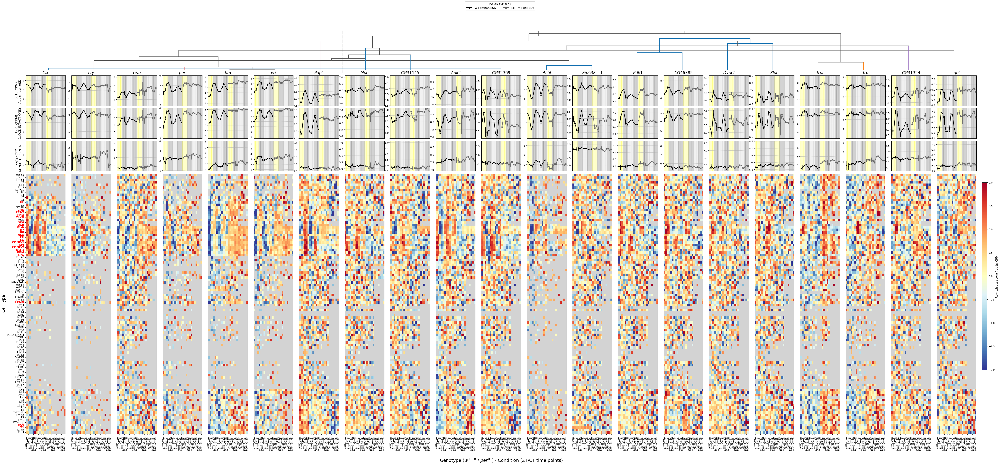

In [11]:
#Only considering the desired cell types

# ============================================================
# Combined figure (3 pseudo-bulk rows + heatmaps)
# - Row A: TRUE bulk-like per-replicate (ALL cell types), mean±SD
# - Row B: TRUE bulk-like per-replicate (CLOCK-ONLY red set), mean±SD
# - Row C: TRUE bulk-like per-replicate (NON-CLOCK set), mean±SD
# - Row D: Cell-type heatmaps with low-coverage masking + zero->NaN
# ============================================================

import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib.lines import Line2D
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster.hierarchy import linkage, dendrogram, to_tree  # add to_tree

# ----------------------------
# USER SETTINGS
# ----------------------------
clock_genes = [
    'Clk','cry','cwo','per','tim','vri','Pdp1',
    'Moe', 'CG31145', 'Ank2', 'CG32369', 'Achl', 'Eip63F-1', 'Pdk1', 'CG46385', 'Dyrk2', 'Slob', 'trpl', 'trp', 'CG31324', 'gol'
]


# Cell types marked as "clock oscillating" (red) for heatmap + Row B pooling
desired_celltypes = [
    "FAT-1","FAT-2","HE","ALG","CHG",
    "PNG","SPG","CG","EG","LEMG","CONE-1","CONE-2",
    "R1-6","R7","R8","CLKN","KCy","PGM","DRA","OCR","T1","EPI", 
]

celltype_col   = 'all_celltype'
time_col       = 'final_Conditions'   # e.g., "WT_ZT0_1", "MT_CT12_2"
layer          = 'counts'
scale_factor   = 1_000_000
exclude_times  = {'CT28'}
# Temporarily exclude these cell types from heatmaps and clock/non-clock rows
exclude_celltypes = {'Unannotated'}   # set() to include again
# Also exclude from Row A (ALL) if you want:
exclude_from_all = False              # True -> remove from ALL row too

# Heatmap
vmin, vmax = -2, 2
cmap = sns.color_palette("RdYlBu_r", as_cmap=True)
cmap.set_bad('lightgray')

# Coverage/zeros handling for heatmaps
min_cells   = 20        # gray-out threshold
zero_policy = 'na'      # treat log1p(CPM)==0 as NaN pre-zscore
z_fill      = None      # keep NaNs gray

# ----------------------------
# HELPERS
# ----------------------------
def _extract_gt_time_rep(s):
    m_g = re.search(r'(WT|MT)', s)
    m_t = re.search(r'(ZT|CT)\d+', s)
    m_r = re.search(r'(?:ZT|CT)\d+_(\d+)', s)
    g = m_g.group(1) if m_g else np.nan
    t = m_t.group(0) if m_t else np.nan
    r = m_r.group(1) if m_r else None
    return g, t, r

def build_col_order_from_available(idx_multi, exclude_times=()):
    all_times = {i[2] for i in idx_multi}
    kept = [t for t in all_times if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)', s); grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    times_sorted = sorted(kept, key=keyfun)
    return [('WT', t) for t in times_sorted] + [('MT', t) for t in times_sorted]

def tuples_to_names(tuples):
    return [f"{g}_{t}" for (g, t) in tuples]

def parse_colname(cname):
    g, t = cname.split('_'); m = re.match(r'(ZT|CT)(\d+)', t)
    return g, m.group(1), int(m.group(2))

def shade_background(ax, colnames):
    for idx_c, cname in enumerate(colnames):
        g, tt, hr = parse_colname(cname)
        z = 0   # behind the lines
        if tt == 'ZT':
            if 0 <= hr < 12: ax.axvspan(idx_c-0.5, idx_c+0.5, color='yellow', alpha=0.20, zorder=z)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35, zorder=z)
        else:
            if 0 <= hr <= 8: ax.axvspan(idx_c-0.5, idx_c+0.5, color='lightgray', alpha=0.30, zorder=z)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35, zorder=z)


def local_row_z(mat_df):
    mu = mat_df.mean(axis=1, skipna=True)
    sd = mat_df.std(axis=1, skipna=True).replace(0, np.nan)
    return mat_df.sub(mu, axis=0).div(sd, axis=0)

def slice_gene_heat_matrix(log1p_mat, gene, col_order):
    s = log1p_mat.loc[gene]
    idx = log1p_mat.columns
    tmp = pd.DataFrame({
        'celltype':[i[0] for i in idx],
        'genotype':[i[1] for i in idx],
        'time_point':[i[2] for i in idx],
        'value':s.values
    })
    tmp['colkey'] = list(zip(tmp['genotype'], tmp['time_point']))
    heat = tmp.pivot(index='celltype', columns='colkey', values='value')
    return heat.reindex(columns=col_order)

# ----------------------------
# CORE SUMMARIES
# ----------------------------
def pseudobulk_log1p_cpm(adata, genes, celltype_col, time_col, layer='counts',
                         scale_factor=1_000_000, exclude_times=(), exclude_celltypes=()):
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    var = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    key_df = pd.DataFrame({celltype_col: adata.obs[celltype_col].astype(str).values,
                           'genotype': gt, 'time_point': tp})
    valid = key_df['genotype'].notna() & key_df['time_point'].notna()
    if exclude_times:
        valid &= ~key_df['time_point'].isin(exclude_times)
    # NEW: drop excluded cell types
    if exclude_celltypes:
        valid &= ~key_df[celltype_col].astype(str).isin(set(exclude_celltypes))
    key_df = key_df.loc[valid]; X = X[valid.values, :]

    grouped = key_df.groupby([celltype_col, 'genotype', 'time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in grouped.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    agg = pd.DataFrame(np.vstack(sums), columns=var,
                       index=pd.MultiIndex.from_tuples(cols, names=[celltype_col,'genotype','time_point'])).T
    genes_use = [g for g in genes if g in agg.index]
    agg = agg.loc[genes_use]

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

def bulk_like_log1p_cpm_by_rep(adata, layer, time_col, scale=1_000_000,
                               exclude_times=(), celltype_col=None, keep_celltypes=None):
    """
    TRUE BULK per replicate with optional cell-type filtering.
    Returns: DataFrame genes x MultiIndex(genotype,time_point,replicate)
    """
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    genes = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    parsed = tser.apply(_extract_gt_time_rep)
    meta = pd.DataFrame(parsed.tolist(), columns=['genotype','time_point','replicate'])
    if celltype_col is not None:
        meta[celltype_col] = adata.obs[celltype_col].astype(str).values

    valid = meta['genotype'].notna() & meta['time_point'].notna()
    if exclude_times: valid &= ~meta['time_point'].isin(exclude_times)
    if keep_celltypes is not None and celltype_col is not None:
        keep = pd.Index(keep_celltypes).astype(str)
        valid &= meta[celltype_col].isin(keep)

    X = X[valid.values, :]; meta = meta.loc[valid]

    groups = meta.groupby(['genotype','time_point','replicate'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    if not sums:
        return pd.DataFrame(index=genes)

    agg = pd.DataFrame(np.vstack(sums), columns=genes,
                       index=pd.MultiIndex.from_tuples(cols, names=['genotype','time_point','replicate'])).T

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale
    return np.log1p(cpm)

# ----------------------------
# BUILD MATRICES FOR HEATMAPS
# ----------------------------
log1p_mat = pseudobulk_log1p_cpm(
    adata, genes=clock_genes, celltype_col=celltype_col, time_col=time_col,
    layer=layer, scale_factor=scale_factor, exclude_times=exclude_times,
    exclude_celltypes=exclude_celltypes   # <--- add this
)

col_order  = build_col_order_from_available(log1p_mat.columns, exclude_times=exclude_times)
colnames   = tuples_to_names(col_order)

# ----------------------------
# PARTITIONS FOR THE THREE PSEUDO-BULK ROWS
# ----------------------------
all_cts = pd.Index(adata.obs[celltype_col].astype(str).unique())
all_cts = all_cts.difference(pd.Index(list(exclude_celltypes)))  # drop Unannotated

clock_cts    = pd.Index(desired_celltypes).intersection(all_cts)
nonclock_cts = all_cts.difference(clock_cts)


# A) ALL cell types
bulk_all_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col,
    keep_celltypes=(all_cts if exclude_from_all else None)
)

# B) CLOCK-ONLY
bulk_clock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=clock_cts
)
# C) NON-CLOCK
bulk_nonclock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=nonclock_cts
)

# ---------- Harmonize gene identifiers for pseudo-bulk (top panels) ----------
# Try to map the bulk matrices' index (adata.var_names) to gene symbols.
symbol_cols = [c for c in ['gene_symbols','gene_symbol','SYMBOL','gene','gene_name','Gene']
               if c in adata.var.columns]

def _maybe_remap_to_symbols(df):
    if df.empty: 
        return df
    if not symbol_cols:
        return df  # nothing to map with
    # Build map: current var_names -> symbols
    var_names = pd.Index(adata.var_names).astype(str)
    symbols   = adata.var[symbol_cols[0]].astype(str)
    name_map  = dict(zip(var_names, symbols))
    # If most of our target genes (clock_genes) are NOT present, try remapping:
    present = sum(g in df.index for g in clock_genes)
    if present < max(1, int(0.5 * len(clock_genes))):
        df = df.rename(index=name_map)
    return df

bulk_all_by_rep      = _maybe_remap_to_symbols(bulk_all_by_rep)
bulk_clock_by_rep    = _maybe_remap_to_symbols(bulk_clock_by_rep)
bulk_nonclock_by_rep = _maybe_remap_to_symbols(bulk_nonclock_by_rep)



print("genes in bulk_all_by_rep (first 5):", list(bulk_all_by_rep.index[:5]))
missing = [g for g in clock_genes if g not in bulk_all_by_rep.index]
print("missing in bulk:", missing[:10], f"... ({len(missing)} total)")


def _agg_mean_sd(df, col_order):
    # Build the exact MultiIndex we want
    mi = pd.MultiIndex.from_tuples(col_order, names=['genotype','time_point'])

    if df.shape[1] == 0:
        # no columns at all → return empty frames with right shape
        means = pd.DataFrame(index=clock_genes, columns=mi, dtype=float)
        sds   = pd.DataFrame(index=clock_genes, columns=mi, dtype=float)
    else:
        # group by (genotype, time_point) across replicates
        means = df.groupby(axis=1, level=['genotype','time_point']).mean()
        sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)

        # ensure exact columns and order (fill missing with NaN)
        means = means.reindex(columns=mi)
        sds   = sds.reindex(columns=mi)

    # keep only the genes you plot (so .loc[gene] never misses)
    means = means.reindex(index=clock_genes)
    sds   = sds.reindex(index=clock_genes)

    # convert MI → the string labels used everywhere downstream
    means.columns = tuples_to_names(means.columns.to_list())
    sds.columns   = means.columns
    return means, sds


means_all,      sds_all      = _agg_mean_sd(bulk_all_by_rep,      col_order)
means_clock,    sds_clock    = _agg_mean_sd(bulk_clock_by_rep,    col_order)
means_nonclock, sds_nonclock = _agg_mean_sd(bulk_nonclock_by_rep, col_order)

# --- Shared y-limits per gene across the three pseudo-bulk rows (include SD) ---
def compute_shared_ylims(clock_genes, triplets):
    """
    triplets = [(means_df1, sds_df1), (means_df2, sds_df2), (means_df3, sds_df3)]
    Returns: dict {gene: (ymin, ymax)} with small padding.
    """
    ylims = {}
    for g in clock_genes:
        lows, highs = [], []
        for means_df, sds_df in triplets:
            if g in means_df.index:
                m = means_df.loc[g].astype(float).values
                s = (sds_df.loc[g].astype(float).values
                     if g in sds_df.index else np.zeros_like(m))
                lo = m - s
                hi = m + s
                lo = lo[np.isfinite(lo)]
                hi = hi[np.isfinite(hi)]
                if lo.size: lows.append(lo.min())
                if hi.size: highs.append(hi.max())
        if lows and highs:
            y0 = float(np.min(lows))
            y1 = float(np.max(highs))
            if not np.isfinite(y0): y0 = 0.0
            if not np.isfinite(y1) or y1 <= y0: y1 = y0 + 1.0
            pad = 0.05 * (y1 - y0)
            ylims[g] = (y0 - pad, y1 + pad)
        else:
            ylims[g] = None
    return ylims

ylims_by_gene = compute_shared_ylims(
    clock_genes,
    [(means_all, sds_all), (means_clock, sds_clock), (means_nonclock, sds_nonclock)]
)

# ----------------------------
# CLUSTER ROW ORDER FOR HEATMAPS (freeze or cluster)
# ----------------------------
cluster_ct_mode = "all"   # "keep" | "all" | "desired_only" | "desired_first"
cluster_rest    = True     # only used if "desired_first"

celltypes_all = sorted({i[0] for i in log1p_mat.columns})

# Build the same big matrix (celltype × [gene×col])
mats = []
for g in clock_genes:
    H = slice_gene_heat_matrix(log1p_mat, g, col_order).reindex(celltypes_all)
    H_z = local_row_z(H)
    H_z.columns = pd.MultiIndex.from_product([[g], H_z.columns], names=['gene','colkey'])
    mats.append(H_z)
combined = pd.concat(mats, axis=1).fillna(0.0)

def _cluster_index(mat):
    if mat.shape[0] <= 1:
        return mat.index
    d = pdist(mat.values, metric='euclidean')
    Z = linkage(d, method='average')
    leaves = dendrogram(Z, no_plot=True)['leaves']
    return mat.index[leaves]

desired_cts = pd.Index(desired_celltypes).intersection(combined.index)

if cluster_ct_mode == "keep":
    # Keep whatever order you already have (alphabetical here).
    ordered_celltypes = combined.index

elif cluster_ct_mode == "all":
    ordered_celltypes = _cluster_index(combined)

elif cluster_ct_mode == "desired_only":
    ordered_celltypes = _cluster_index(combined.loc[desired_cts]) if len(desired_cts) else combined.index

elif cluster_ct_mode == "desired_first":
    if len(desired_cts) == 0:
        ordered_celltypes = _cluster_index(combined)
    else:
        desired_order = _cluster_index(combined.loc[desired_cts])
        rest = combined.index.difference(desired_cts)
        rest_order = _cluster_index(combined.loc[rest]) if (cluster_rest and len(rest)) else rest
        ordered_celltypes = desired_order.append(rest_order)
else:
    raise ValueError("cluster_ct_mode must be one of: keep, all, desired_only, desired_first")



# ----------------------------
# COVERAGE (for masking)
# ----------------------------
obs = adata.obs[[celltype_col, time_col]].copy()
tser = obs[time_col].astype(str)
obs['genotype']   = tser.str.extract(r'(WT|MT)', expand=False)
obs['time_point'] = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)
valid = obs['genotype'].notna() & obs['time_point'].notna()
if exclude_times:
    valid &= ~obs['time_point'].isin(exclude_times)
# NEW: drop excluded cell types for coverage
if exclude_celltypes:
    valid &= ~obs[celltype_col].astype(str).isin(set(exclude_celltypes))
obs = obs.loc[valid]


n_cells = obs.groupby([celltype_col, 'genotype', 'time_point'], observed=False).size()
cov_mat = (n_cells.rename('n').reset_index()
           .assign(colkey=lambda d: list(zip(d['genotype'], d['time_point'])))
           .pivot(index=celltype_col, columns='colkey', values='n'))
cov_mat = cov_mat.reindex(index=ordered_celltypes).reindex(columns=col_order)
# ============================
# OPTIONAL: COLUMN CLUSTERING
# ============================

# --- SETTINGS ---
cluster_columns = False
cluster_mode    = "by_genotype"   # <= preserves WT block then MT block
cluster_genes   = False            # <= NEW: cluster big column order of genes

# ============================
# OPTIONAL: COLUMN CLUSTERING
# ============================
def _build_gene_heat_z(gene):
    if gene not in log1p_mat.index: return None
    heat_abs = slice_gene_heat_matrix(log1p_mat, gene, col_order).reindex(ordered_celltypes)
    heat_abs = heat_abs.mask(cov_mat < min_cells)
    if zero_policy == 'na':
        heat_abs = heat_abs.where(heat_abs != 0, np.nan)
    return local_row_z(heat_abs)

if cluster_columns:
    blocks = []
    for g in clock_genes:
        hz = _build_gene_heat_z(g)
        if hz is not None:
            hz.index = pd.MultiIndex.from_product([[g], hz.index], names=['gene','celltype'])
            blocks.append(hz)
    if not blocks:
        raise RuntimeError("No genes available to build column clustering matrix.")
    col_feat = pd.concat(blocks, axis=0).fillna(0.0)

    def _cluster_cols(cols):
        if len(cols) <= 1: return cols
        d = pdist(col_feat[cols].T.values, metric='euclidean')
        Z = linkage(d, method='average')
        order = dendrogram(Z, no_plot=True)['leaves']
        return [cols[i] for i in order]

    if cluster_mode == "global":
        new_idx = dendrogram(linkage(pdist(col_feat.T.values), method='average'), no_plot=True)['leaves']
        col_order = [col_feat.columns[i] for i in new_idx]
    elif cluster_mode == "by_genotype":
        wt = [c for c in col_order if c[0] == 'WT']
        mt = [c for c in col_order if c[0] == 'MT']
        col_order = _cluster_cols(wt) + _cluster_cols(mt)
    else:
        raise ValueError("cluster_mode must be 'global' or 'by_genotype'.")

# --- keep all three in sync ---
colnames = tuples_to_names(col_order)
cov_mat  = cov_mat.reindex(columns=col_order)

# IMPORTANT: rename pseudo-bulk columns back to strings so WT_/MT_ masks work
def _reindex_pair(means_df, sds_df, col_order, colnames):
    # If columns are MultiIndex, align to MI then convert to strings.
    if isinstance(means_df.columns, pd.MultiIndex):
        mi = pd.MultiIndex.from_tuples(col_order, names=['genotype','time_point'])
        means_df = means_df.reindex(columns=mi)
        sds_df   = sds_df.reindex(columns=mi)
        means_df.columns = colnames
        sds_df.columns   = colnames
    else:
        # Already strings: just align to the desired string order.
        means_df = means_df.reindex(columns=colnames)
        sds_df   = sds_df.reindex(columns=colnames)
    return means_df, sds_df


means_all,      sds_all      = _reindex_pair(means_all,      sds_all,      col_order, colnames)
means_clock,    sds_clock    = _reindex_pair(means_clock,    sds_clock,    col_order, colnames)
means_nonclock, sds_nonclock = _reindex_pair(means_nonclock, sds_nonclock, col_order, colnames)

# ============================
# OPTIONAL: GENE CLUSTERING
# ============================

# choose which cell types define the gene distances
gene_cluster_cts_mode = "desired_only"   # "desired_only" | "all"
desired_cts_in_order = pd.Index(desired_celltypes).intersection(ordered_celltypes)
ct_for_genes = (desired_cts_in_order if (gene_cluster_cts_mode == "desired_only" and len(desired_cts_in_order) >= 2)
                    else ordered_celltypes)
if cluster_genes:
    # build per-gene feature vectors from the same masked, row-z heatmaps
    gene_blocks = []
    for g in clock_genes:
        hz = _build_gene_heat_z(g)
        if hz is not None:
            # flatten celltypes×columns to one vector
            v = hz.reindex(index=ct_for_genes, columns=col_order).to_numpy().ravel()
            gene_blocks.append((g, np.nan_to_num(v, nan=0.0)))
    if gene_blocks:
        G = np.vstack([v for _, v in gene_blocks])
        d  = pdist(G, metric='euclidean')
        Z  = linkage(d, method='average')
        ord_idx = dendrogram(Z, no_plot=True)['leaves']
        GENE_LIST = [gene_blocks[i][0] for i in ord_idx]
    else:
        GENE_LIST = list(clock_genes)
else:
    GENE_LIST = list(clock_genes)


# ---------- Build gene features for TOP dendrogram (desired-only) ----------
# We DO NOT reorder columns; we only compute Z and then draw with a fixed leaf order.
gene_vecs = {}
for g in GENE_LIST:  # keep your existing left->right order
    hz = _build_gene_heat_z(g)        # masked + row-z across cell types
    if hz is None:
        continue
    v = hz.reindex(index=ct_for_genes, columns=col_order).to_numpy().ravel()
    gene_vecs[g] = np.nan_to_num(v, nan=0.0)

dendro_genes = [g for g in GENE_LIST if g in gene_vecs]   # keep only genes with vectors
Z = None
if len(dendro_genes) >= 2:
    G = np.vstack([gene_vecs[g] for g in dendro_genes])
    d = pdist(G, metric='euclidean')
    Z = linkage(d, method='average')

# ----- Color each gene by its most-correlated clock gene (desired-only) -----
clock_core = ['Clk','cry','cwo','per','tim','vri','Pdp1']
clock_core = [g for g in clock_core if g in gene_vecs]            # present leaves only
palette = mpl.colormaps['tab10'].colors
clock_colors = {g: palette[i % len(palette)] for i, g in enumerate(clock_core)}

def _safe_corr(a, b):
    sa, sb = np.std(a), np.std(b)
    if sa == 0 or sb == 0: return 0.0
    r = np.corrcoef(a, b)[0,1]
    return 0.0 if not np.isfinite(r) else float(r)

leaf_to_clock = {}
for g in dendro_genes:
    if g in clock_core:
        leaf_to_clock[g] = g
    else:
        best = None; best_r = -1e9
        for cg in clock_core:
            r = _safe_corr(gene_vecs[g], gene_vecs[cg])
            if r > best_r:
                best_r, best = r, cg
        leaf_to_clock[g] = best

leaf_color_map = {g: clock_colors.get(leaf_to_clock.get(g), '0.5') for g in dendro_genes}

def plot_fixed_order_dendrogram(
    ax, Z, leaf_labels, fixed_order,
    leaf_color_map=None,
    ybase_frac=0.04,     # very little blank space under leaves
    y_scale=1.55,        # overall tree height
    y_mode="ecdf",       # "ecdf" spreads levels uniformly; "power" uses concave power law
    ecdf_gamma=1.35,     # >1 gives a bit more space near the top (for y_mode="ecdf")
    power_alpha=2.2,     # concave transform if y_mode="power"
    lw=1.6, neutral='0.35'
):
    """
    Draw a dendrogram with *fixed leaf order* (no column reordering) and
    a custom vertical mapping that reduces crowding in the middle/top.
    y_mode="ecdf" ranks linkage distances and spaces them uniformly.
    """

    if Z is None or len(leaf_labels) < 2:
        ax.axis('off'); return

    # leaf x-positions in *your* fixed order
    x_pos = {lab: i for i, lab in enumerate(fixed_order) if lab in leaf_labels}

    dvals = Z[:, 2]
    maxd  = float(dvals.max()) if dvals.size else 1.0
    ybase = maxd * ybase_frac
    span  = maxd * y_scale

    if y_mode == "ecdf":
        # ECDF mapping: distances -> uniform [0,1] by rank
        levels = np.sort(dvals)
        L = len(levels)
        def _to_y(dist):
            k = np.searchsorted(levels, dist, side='right')  # rank 1..L
            u = k / L
            if ecdf_gamma != 1.0:
                u = u ** ecdf_gamma
            return ybase + span * u
    elif y_mode == "power":
        # concave power law (what we tried earlier)
        def _to_y(dist):
            if maxd <= 0: return ybase
            u = dist / maxd
            u = 1.0 - (1.0 - u) ** power_alpha
            return ybase + span * u
    else:
        raise ValueError("y_mode must be 'ecdf' or 'power'")

    root = to_tree(Z, rd=False)

    def _draw(node):
        if node.is_leaf():
            lab = leaf_labels[node.id]
            x = x_pos[lab]
            c = (leaf_color_map.get(lab, 'k') if leaf_color_map else 'k')
            return x, ybase, c

        x1, y1, c1 = _draw(node.left)
        x2, y2, c2 = _draw(node.right)
        y = _to_y(node.dist)

        ax.plot([x1, x1], [y1, y], color=c1, lw=lw, zorder=5, solid_capstyle='round')
        ax.plot([x2, x2], [y2, y], color=c2, lw=lw, zorder=5, solid_capstyle='round')

        c = c1 if (c1 == c2) else neutral
        ax.plot([x1, x2], [y, y], color=c,  lw=lw, zorder=5, solid_capstyle='round')

        return (x1 + x2) / 2.0, y, c

    _draw(root)

    ax.set_xlim(-0.5, len(fixed_order) - 0.5)
    ax.set_ylim(0, ybase + span * 1.03)
    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)
        

# If you want y-lims computed in the new gene order (not required but tidy)
ylims_by_gene = compute_shared_ylims(GENE_LIST,
    [(means_all, sds_all), (means_clock, sds_clock), (means_nonclock, sds_nonclock)]
)

# ===== after this point, your plotting code runs as-is =====
# It will use the new 'col_order' and 'colnames', and shade_background/xticklabels will reflect the clustered order.

print("Top-panels gene coverage in ALL:")
for g in GENE_LIST[:5]:
    print(g, "exists in bulk:", g in bulk_all_by_rep.index)

# ----------------------------
# PLOTTING (top dendrogram + 3 rows + heatmaps)
# ----------------------------
n_genes = len(GENE_LIST)
fig = plt.figure(figsize=(60, 28))  # a bit taller
gs  = gridspec.GridSpec(
    nrows=5, ncols=n_genes,
    height_ratios=[1.0, 0.7, 0.7, 0.7, 6.0]  # larger dendro row
)
gs.update(hspace=0.03, wspace=0.15)

# Dendrogram spanning all columns (colored, lifted off labels)
ax_dendro = fig.add_subplot(gs[0, :])
plot_fixed_order_dendrogram(
    ax_dendro, Z, dendro_genes, GENE_LIST,
    leaf_color_map=leaf_color_map,
    ybase_frac=0.20,
    y_scale=2.50,
    y_mode="ecdf",      # ← new
    ecdf_gamma=1.35     # try 1.2–1.6 depending on how airy you want the top
)


# The rest shift down by one row
axes_top_all      = [fig.add_subplot(gs[1, i]) for i in range(n_genes)]
axes_top_clock    = [fig.add_subplot(gs[2, i]) for i in range(n_genes)]
axes_top_nonclock = [fig.add_subplot(gs[3, i]) for i in range(n_genes)]
axes_heat         = [fig.add_subplot(gs[4, i]) for i in range(n_genes)]


def _plot_row(ax_list, means_df, sds_df, row_label, ylims_by_gene=None, show_titles=True):
    for i, gene in enumerate(GENE_LIST):
        ax = ax_list[i]
        # draw spans behind lines
        shade_background(ax, colnames)

        if gene not in means_df.index:
            ax.set_axis_off()
            continue

        vals = means_df.loc[gene].astype(float).to_numpy()
        errs = (sds_df.loc[gene].astype(float).to_numpy()
                if gene in sds_df.index else np.zeros_like(vals))

        # If everything is NaN for this gene, skip gracefully
        if not np.isfinite(vals).any():
            ax.set_axis_off()
            continue

        x = np.arange(len(colnames))
        wt_mask = np.fromiter((c.startswith('WT_') for c in colnames), dtype=bool, count=len(colnames))
        mt_mask = ~wt_mask

        # plot above shading
        ax.errorbar(x[wt_mask], vals[wt_mask], yerr=errs[wt_mask],
                    fmt='o-', color='black', linewidth=1.8, markersize=4, zorder=3, label='WT (mean±SD)')
        ax.errorbar(x[mt_mask], vals[mt_mask], yerr=errs[mt_mask],
                    fmt='s-', color='dimgray', linewidth=1.8, markersize=4, zorder=3, label='MT (mean±SD)')
        # shared y-lims per gene
        if ylims_by_gene and ylims_by_gene.get(gene) is not None:
            ax.set_ylim(*ylims_by_gene[gene])
        else:
            finite_vals = vals[np.isfinite(vals)]
            if len(finite_vals):
                ymin = float(finite_vals.min()) - 0.5
                ymax = float(finite_vals.max()) + 0.5
                if ymin == ymax: ymin -= 0.5; ymax += 0.5
                ax.set_ylim(ymin, ymax)

        ax.set_xlim(-0.5, len(colnames)-0.5)
        ax.grid(axis='y', linestyle='--', alpha=0.6)

        # show titles only if requested (Row A)
        if show_titles:
            ax.set_title(f"$\\mathit{{{gene}}}$", fontsize=16)
        else:
            ax.set_title("")

        ax.set_xticks([]); ax.set_xticklabels([]); ax.set_xlabel("")
        if i == 0:
            ax.set_ylabel(row_label, fontsize=13)
        else:
            ax.set_ylabel("")



# Top rows: A (all), B (clock-only), C (non-clock)
_plot_row(axes_top_all,      means_all,      sds_all,      "log1p(CPM)\nALL (mean±SD)",       ylims_by_gene, True)
_plot_row(axes_top_clock,    means_clock,    sds_clock,    "log1p(CPM)\nCLOCK-INTACT ONLY",   ylims_by_gene, False)
_plot_row(axes_top_nonclock, means_nonclock, sds_nonclock, "log1p(CPM)\nNON-CLOCK-INTACT",    ylims_by_gene, False)



# One legend for all top rows
fig.legend(
    handles=[
        Line2D([0],[0], marker='o', color='black',   label='WT (mean±SD)', markersize=7, linestyle='-'),
        Line2D([0],[0], marker='s', color='dimgray', label='MT (mean±SD)', markersize=7, linestyle='-')
    ],
    loc='upper center', ncol=2, fontsize=12, title="Pseudo-bulk rows"
)

# Heatmaps
for i, gene in enumerate(GENE_LIST):
    ax = axes_heat[i]
    if gene not in log1p_mat.index:
        ax.set_axis_off(); continue

    heat_abs = slice_gene_heat_matrix(log1p_mat, gene, col_order).reindex(ordered_celltypes)

    # mask low coverage
    heat_abs = heat_abs.mask(cov_mat < min_cells)

    # treat zeros per policy
    if zero_policy == 'na':
        heat_abs = heat_abs.where(heat_abs != 0, np.nan)

    # global row-wise z
    heat_z = local_row_z(heat_abs)

    # rows with <2 valids -> keep NaN (gray) or fill
    valid_counts = heat_abs.notna().sum(axis=1)
    if z_fill is not None:
        heat_z.loc[valid_counts < 2, :] = z_fill

    sns.heatmap(
        heat_z, ax=ax, cmap=cmap, center=0, vmin=vmin, vmax=vmax,
        cbar=False, xticklabels=True, yticklabels=(True if i == 0 else False),
        linewidths=0, linecolor=None
    )
    if i == 0:
        ax.set_facecolor("white")
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
        ax.set_ylabel("Cell Type", fontsize=16)
    else:
        ax.set_ylabel("")
        ax.set_yticks([])            # <- hide ticks on interior columns
        ax.set_yticklabels([])
    ax.set_title(""); ax.set_xlabel(""); ax.set_xlim(0, len(col_order)); ax.grid(False)

    # optional vertical divider under the dendrogram
    # draw once, after the dendrogram is plotted
    n_clock = 7  # adjust if needed
    ax_dendro.axvline(n_clock - 0.5, ymin=0, ymax=1, color='0.7', lw=1, ls='--', zorder=3)


    # pretty x tick labels with mathtext for genotypes
    ax.set_xticks(np.arange(len(col_order)) + 0.5)
    xticklabels = []
    for g,t in col_order:
        tag = f"{g}_{t}"
        xticklabels.append(tag.replace("WT_", r"$w^{1118}$-").replace("MT_", r"$per^{01}$-"))
    ax.set_xticklabels(xticklabels, rotation=90, ha='center', fontsize=10)
    ax.tick_params(axis='x', pad=10)

# Highlight selected clock-oscillating cell types in red on the first heatmap axis
highlight = set(desired_celltypes)
ax0 = axes_heat[0]
for tick in ax0.get_yticklabels():
    lbl = tick.get_text()
    if lbl in highlight:
        tick.set_color('red'); tick.set_fontweight('bold')

# Shared x-label + colorbar
fig.supxlabel(r"Genotype ($w^{1118}$ / $per^{01}$) · Condition (ZT/CT time points)", fontsize=18, y=0.06)

sm = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)
sm.set_array([])
cbar_ax = fig.add_axes([0.955, 0.25, 0.005, 0.38])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label("Row-wise z-score (log1p-CPM)", fontsize=12)

plt.subplots_adjust(left=0.05, right=0.95, bottom=0.12, top=0.94, wspace=0.15, hspace=0.06)
# (smaller 'top' => more whitespace above the dendrogram)

plt.show()


In [118]:
# ============================================================
# Combined figure (3 pseudo-bulk rows + heatmaps)
# - Row A: TRUE bulk-like per-replicate (ALL cell types), mean±SD
# - Row B: TRUE bulk-like per-replicate (CLOCK-ONLY red set), mean±SD
# - Row C: TRUE bulk-like per-replicate (NON-CLOCK set), mean±SD
# - Row D: Cell-type heatmaps with low-coverage masking + zero->NaN
# ============================================================

import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from matplotlib.lines import Line2D
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram
from matplotlib.ticker import MaxNLocator, StrMethodFormatter
from matplotlib.ticker import MultipleLocator
from matplotlib.ticker import AutoLocator, FuncFormatter

# ----------------------------
# USER SETTINGS
# ----------------------------
clock_genes = [
    'Clk','cry','cwo','per','tim','vri','Pdp1',
    'Moe', 'CG31145', 'Ank2', 'CG32369', 'Achl', 'Eip63F-1', 'Pdk1', 'CG46385', 'Dyrk2', 'Slob', 'trpl', 'trp', 'CG31324', 'gol'
]

# Cell types marked as "clock oscillating" (red) for heatmap + Row B pooling
desired_celltypes = [
    "FAT-1","FAT-2","HE","ALG","CHG",
    "PNG","SPG","CG","EG","LEMG","CONE-1","CONE-2",
    "R1-6","R7","R8","CLKN","KCy","PGM","DRA","OCR","T1","EPI", 
]

celltype_col   = 'all_celltype'
time_col       = 'final_Conditions'   # e.g., "WT_ZT0_1", "MT_CT12_2"
layer          = 'counts'
scale_factor   = 1_000_000
exclude_times  = {'CT28'}
# Temporarily exclude these cell types from heatmaps and clock/non-clock rows
exclude_celltypes = {'Unannotated'}   # set() to include again
# Also exclude from Row A (ALL) if you want:
exclude_from_all = False              # True -> remove from ALL row too

# Heatmap
vmin, vmax = -2, 2
cmap = sns.color_palette("RdYlBu_r", as_cmap=True)
cmap.set_bad('lightgray')

# Coverage/zeros handling for heatmaps
min_cells   = 20        # gray-out threshold
zero_policy = 'na'      # treat log1p(CPM)==0 as NaN pre-zscore
z_fill      = None      # keep NaNs gray

# ----------------------------
# HELPERS
# ----------------------------
def _extract_gt_time_rep(s):
    m_g = re.search(r'(WT|MT)', s)
    m_t = re.search(r'(ZT|CT)\d+', s)
    m_r = re.search(r'(?:ZT|CT)\d+_(\d+)', s)
    g = m_g.group(1) if m_g else np.nan
    t = m_t.group(0) if m_t else np.nan
    r = m_r.group(1) if m_r else None
    return g, t, r

def build_col_order_from_available(idx_multi, exclude_times=()):
    all_times = {i[2] for i in idx_multi}
    kept = [t for t in all_times if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)', s); grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    times_sorted = sorted(kept, key=keyfun)
    return [('WT', t) for t in times_sorted] + [('MT', t) for t in times_sorted]

def tuples_to_names(tuples):
    return [f"{g}_{t}" for (g, t) in tuples]

def parse_colname(cname):
    g, t = cname.split('_'); m = re.match(r'(ZT|CT)(\d+)', t)
    return g, m.group(1), int(m.group(2))

def shade_background(ax, colnames):
    for idx_c, cname in enumerate(colnames):
        g, tt, hr = parse_colname(cname)
        if tt == 'ZT':
            if 0 <= hr < 12: ax.axvspan(idx_c-0.5, idx_c+0.5, color='yellow', alpha=0.20)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)
        else:
            if 0 <= hr <= 8: ax.axvspan(idx_c-0.5, idx_c+0.5, color='lightgray', alpha=0.30)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)

def local_row_z(mat_df):
    mu = mat_df.mean(axis=1, skipna=True)
    sd = mat_df.std(axis=1, skipna=True).replace(0, np.nan)
    return mat_df.sub(mu, axis=0).div(sd, axis=0)

def slice_gene_heat_matrix(log1p_mat, gene, col_order):
    s = log1p_mat.loc[gene]
    idx = log1p_mat.columns
    tmp = pd.DataFrame({
        'celltype':[i[0] for i in idx],
        'genotype':[i[1] for i in idx],
        'time_point':[i[2] for i in idx],
        'value':s.values
    })
    tmp['colkey'] = list(zip(tmp['genotype'], tmp['time_point']))
    heat = tmp.pivot(index='celltype', columns='colkey', values='value')
    return heat.reindex(columns=col_order)

# ----------------------------
# CORE SUMMARIES
# ----------------------------
def pseudobulk_log1p_cpm(adata, genes, celltype_col, time_col, layer='counts',
                         scale_factor=1_000_000, exclude_times=(), exclude_celltypes=()):
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    var = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    key_df = pd.DataFrame({celltype_col: adata.obs[celltype_col].astype(str).values,
                           'genotype': gt, 'time_point': tp})
    valid = key_df['genotype'].notna() & key_df['time_point'].notna()
    if exclude_times:
        valid &= ~key_df['time_point'].isin(exclude_times)
    # NEW: drop excluded cell types
    if exclude_celltypes:
        valid &= ~key_df[celltype_col].astype(str).isin(set(exclude_celltypes))
    key_df = key_df.loc[valid]; X = X[valid.values, :]

    grouped = key_df.groupby([celltype_col, 'genotype', 'time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in grouped.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    agg = pd.DataFrame(np.vstack(sums), columns=var,
                       index=pd.MultiIndex.from_tuples(cols, names=[celltype_col,'genotype','time_point'])).T
    genes_use = [g for g in genes if g in agg.index]
    agg = agg.loc[genes_use]

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

def bulk_like_log1p_cpm_by_rep(adata, layer, time_col, scale=1_000_000,
                               exclude_times=(), celltype_col=None, keep_celltypes=None):
    """
    TRUE BULK per replicate with optional cell-type filtering.
    Returns: DataFrame genes x MultiIndex(genotype,time_point,replicate)
    """
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    genes = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    parsed = tser.apply(_extract_gt_time_rep)
    meta = pd.DataFrame(parsed.tolist(), columns=['genotype','time_point','replicate'])
    if celltype_col is not None:
        meta[celltype_col] = adata.obs[celltype_col].astype(str).values

    valid = meta['genotype'].notna() & meta['time_point'].notna()
    if exclude_times: valid &= ~meta['time_point'].isin(exclude_times)
    if keep_celltypes is not None and celltype_col is not None:
        keep = pd.Index(keep_celltypes).astype(str)
        valid &= meta[celltype_col].isin(keep)

    X = X[valid.values, :]; meta = meta.loc[valid]

    groups = meta.groupby(['genotype','time_point','replicate'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    if not sums:
        return pd.DataFrame(index=genes)

    agg = pd.DataFrame(np.vstack(sums), columns=genes,
                       index=pd.MultiIndex.from_tuples(cols, names=['genotype','time_point','replicate'])).T

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale
    return np.log1p(cpm)

# ----------------------------
# BUILD MATRICES FOR HEATMAPS
# ----------------------------
log1p_mat = pseudobulk_log1p_cpm(
    adata, genes=clock_genes, celltype_col=celltype_col, time_col=time_col,
    layer=layer, scale_factor=scale_factor, exclude_times=exclude_times,
    exclude_celltypes=exclude_celltypes   # <--- add this
)

col_order  = build_col_order_from_available(log1p_mat.columns, exclude_times=exclude_times)
colnames   = tuples_to_names(col_order)

# ----------------------------
# PARTITIONS FOR THE THREE PSEUDO-BULK ROWS
# ----------------------------
all_cts = pd.Index(adata.obs[celltype_col].astype(str).unique())
all_cts = all_cts.difference(pd.Index(list(exclude_celltypes)))  # drop Unannotated

clock_cts    = pd.Index(desired_celltypes).intersection(all_cts)
nonclock_cts = all_cts.difference(clock_cts)


# A) ALL cell types
bulk_all_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col,
    keep_celltypes=(all_cts if exclude_from_all else None)
)

# B) CLOCK-ONLY
bulk_clock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=clock_cts
)
# C) NON-CLOCK
bulk_nonclock_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor,
    exclude_times=exclude_times, celltype_col=celltype_col, keep_celltypes=nonclock_cts
)

def _agg_mean_sd(df, col_order):
    if df.shape[0] == 0:
        return (pd.DataFrame(index=clock_genes, columns=colnames, dtype=float),
                pd.DataFrame(index=clock_genes, columns=colnames, dtype=float))
    means = df.groupby(axis=1, level=['genotype','time_point']).mean()
    sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
    mi = pd.MultiIndex.from_tuples(col_order, names=['genotype','time_point'])
    means = means.reindex(columns=mi); sds = sds.reindex(columns=mi)
    means.columns = colnames; sds.columns = colnames
    return means, sds

means_all,      sds_all      = _agg_mean_sd(bulk_all_by_rep,      col_order)
means_clock,    sds_clock    = _agg_mean_sd(bulk_clock_by_rep,    col_order)
means_nonclock, sds_nonclock = _agg_mean_sd(bulk_nonclock_by_rep, col_order)

# --- Shared y-limits per gene across the three pseudo-bulk rows (include SD) ---
def compute_shared_ylims(clock_genes, triplets):
    """
    triplets = [(means_df1, sds_df1), (means_df2, sds_df2), (means_df3, sds_df3)]
    Returns: dict {gene: (ymin, ymax)} with small padding.
    """
    ylims = {}
    for g in clock_genes:
        lows, highs = [], []
        for means_df, sds_df in triplets:
            if g in means_df.index:
                m = means_df.loc[g].astype(float).values
                s = (sds_df.loc[g].astype(float).values
                     if g in sds_df.index else np.zeros_like(m))
                lo = m - s
                hi = m + s
                lo = lo[np.isfinite(lo)]
                hi = hi[np.isfinite(hi)]
                if lo.size: lows.append(lo.min())
                if hi.size: highs.append(hi.max())
        if lows and highs:
            y0 = float(np.min(lows))
            y1 = float(np.max(highs))
            if not np.isfinite(y0): y0 = 0.0
            if not np.isfinite(y1) or y1 <= y0: y1 = y0 + 1.0
            pad = 0.05 * (y1 - y0)
            ylims[g] = (y0 - pad, y1 + pad)
        else:
            ylims[g] = None
    return ylims

ylims_by_gene = compute_shared_ylims(
    clock_genes,
    [(means_all, sds_all), (means_clock, sds_clock), (means_nonclock, sds_nonclock)]
)

# ----------------------------
# ROW ORDER FOR HEATMAPS: lock desired at the top, no clustering
# ----------------------------
# all cell types that actually appear in the matrix
celltypes_all = pd.Index(sorted({i[0] for i in log1p_mat.columns}))

# keep only those desired that are present
present_desired = [ct for ct in desired_celltypes if ct in celltypes_all]

# the rest (not in desired); keep alphabetical (or use list(celltypes_all.difference(present_desired)) to keep set order)
others = [ct for ct in celltypes_all if ct not in present_desired]

# final order = desired up top, then others
ordered_celltypes = pd.Index(present_desired + others)

#row_dist = pdist(combined.values, metric='euclidean')
#row_link = linkage(row_dist, method='average')
#row_dend = dendrogram(row_link, no_plot=True)
#ordered_celltypes = combined.index[row_dend['leaves']]

# ----------------------------
# COVERAGE (for masking)
# ----------------------------
obs = adata.obs[[celltype_col, time_col]].copy()
tser = obs[time_col].astype(str)
obs['genotype']   = tser.str.extract(r'(WT|MT)', expand=False)
obs['time_point'] = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)
valid = obs['genotype'].notna() & obs['time_point'].notna()
if exclude_times:
    valid &= ~obs['time_point'].isin(exclude_times)
# NEW: drop excluded cell types for coverage
if exclude_celltypes:
    valid &= ~obs[celltype_col].astype(str).isin(set(exclude_celltypes))
obs = obs.loc[valid]


n_cells = obs.groupby([celltype_col, 'genotype', 'time_point'], observed=False).size()
cov_mat = (n_cells.rename('n').reset_index()
           .assign(colkey=lambda d: list(zip(d['genotype'], d['time_point'])))
           .pivot(index=celltype_col, columns='colkey', values='n'))
cov_mat = cov_mat.reindex(index=ordered_celltypes).reindex(columns=col_order)

# ----------------------------
# PLOTTING (3 top rows + heatmaps)
# ----------------------------
n_genes = len(clock_genes)
fig = plt.figure(figsize=(60, 25))
gs = gridspec.GridSpec(nrows=4, ncols=n_genes, height_ratios=[0.7, 0.7, 0.7, 6.0])
gs.update(hspace=0.00, wspace=0.15)

axes_top_all      = [fig.add_subplot(gs[0, i]) for i in range(n_genes)]
axes_top_clock    = [fig.add_subplot(gs[1, i]) for i in range(n_genes)]
axes_top_nonclock = [fig.add_subplot(gs[2, i]) for i in range(n_genes)]
axes_heat         = [fig.add_subplot(gs[3, i]) for i in range(n_genes)]

def _plot_row(ax_list, means_df, sds_df, row_label, ylims_by_gene=None, show_titles=True):
    for i, gene in enumerate(clock_genes):
        ax = ax_list[i]
        shade_background(ax, colnames)

        if gene not in means_df.index:
            ax.set_axis_off()
            continue

        vals = means_df.loc[gene].astype(float)
        errs = sds_df.loc[gene].astype(float) if gene in sds_df.index else np.zeros_like(vals)

        x = np.arange(len(colnames))
        wt_mask = [c.startswith('WT_') for c in colnames]
        mt_mask = [c.startswith('MT_') for c in colnames]

        ax.errorbar(x[wt_mask], vals[wt_mask], yerr=errs[wt_mask],
                    fmt='o-', color='black', linewidth=1.8, markersize=4, label='WT (mean±SD)')
        ax.errorbar(x[mt_mask], vals[mt_mask], yerr=errs[mt_mask],
                    fmt='s-', color='dimgray', linewidth=1.8, markersize=4, label='MT (mean±SD)')

        # shared y-lims per gene
        if ylims_by_gene and ylims_by_gene.get(gene) is not None:
            ax.set_ylim(*ylims_by_gene[gene])
        else:
            finite_vals = vals[np.isfinite(vals)]
            if len(finite_vals):
                ymin = float(finite_vals.min()) - 0.5
                ymax = float(finite_vals.max()) + 0.5
                if ymin == ymax: ymin -= 0.5; ymax += 0.5
                ax.set_ylim(ymin, ymax)
                # show whole-number ticks only
        # enforce clean integer ticks with step size = 1
        #ax.yaxis.set_major_locator(MultipleLocator(1))
        #ax.yaxis.set_major_formatter("{x:.0f}")
        ax.yaxis.set_major_locator(AutoLocator())  # let matplotlib decide spacing
        ax.yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))

        ax.set_xlim(-0.5, len(colnames)-0.5)
        ax.grid(axis='y', linestyle='--', alpha=0.6)

        # show titles only if requested (Row A)
        if show_titles:
            ax.set_title(f"$\\mathit{{{gene}}}$", fontsize=16)
        else:
            ax.set_title("")

        ax.set_xticks([]); ax.set_xticklabels([]); ax.set_xlabel("")
        if i == 0:
            ax.set_ylabel(row_label, fontsize=13)
        else:
            ax.set_ylabel("")

# Top rows: A (all), B (clock-only), C (non-clock)
_plot_row(axes_top_all,      means_all,      sds_all,
          "log1p(CPM)\nALL (mean±SD)",       ylims_by_gene, show_titles=True)

_plot_row(axes_top_clock,    means_clock,    sds_clock,
          "log1p(CPM)\nCLOCK-INTACT ONLY",   ylims_by_gene, show_titles=False)

_plot_row(axes_top_nonclock, means_nonclock, sds_nonclock,
          "log1p(CPM)\nNON-CLOCK-INTACT",    ylims_by_gene, show_titles=False)

# One legend for all top rows
fig.legend(
    handles=[
        Line2D([0],[0], marker='o', color='black',   label='WT (mean±SD)', markersize=7, linestyle='-'),
        Line2D([0],[0], marker='s', color='dimgray', label='MT (mean±SD)', markersize=7, linestyle='-')
    ],
    loc='upper center', ncol=2, fontsize=12, title="Pseudo-bulk rows"
)

# Heatmaps
for i, gene in enumerate(clock_genes):
    ax = axes_heat[i]
    if gene not in log1p_mat.index:
        ax.set_axis_off(); continue

    heat_abs = slice_gene_heat_matrix(log1p_mat, gene, col_order).reindex(ordered_celltypes)

    # mask low coverage
    heat_abs = heat_abs.mask(cov_mat < min_cells)

    # treat zeros per policy
    if zero_policy == 'na':
        heat_abs = heat_abs.where(heat_abs != 0, np.nan)

    # global row-wise z
    heat_z = local_row_z(heat_abs)

    # rows with <2 valids -> keep NaN (gray) or fill
    valid_counts = heat_abs.notna().sum(axis=1)
    if z_fill is not None:
        heat_z.loc[valid_counts < 2, :] = z_fill

    sns.heatmap(
        heat_z, ax=ax, cmap=cmap, center=0, vmin=vmin, vmax=vmax,
        cbar=False, xticklabels=True, yticklabels=(True if i == 0 else False),
        linewidths=0, linecolor=None
    )
    if i == 0:
        ax.set_facecolor("white")
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
        ax.set_ylabel("Cell Type", fontsize=16)
    else:
        ax.set_ylabel("")
        ax.set_yticks([])            # <- hide ticks on interior columns
        ax.set_yticklabels([])
    ax.set_title(""); ax.set_xlabel(""); ax.set_xlim(0, len(col_order)); ax.grid(False)

    # pretty x tick labels with mathtext for genotypes
    ax.set_xticks(np.arange(len(col_order)) + 0.5)
    xticklabels = []
    for g,t in col_order:
        tag = f"{g}_{t}"
        xticklabels.append(tag.replace("WT_", r"$w^{1118}$-").replace("MT_", r"$per^{01}$-"))
    ax.set_xticklabels(xticklabels, rotation=90, ha='center', fontsize=10)
    ax.tick_params(axis='x', pad=10)

# Highlight selected clock-oscillating cell types in red on the first heatmap axis
highlight = set(desired_celltypes)
ax0 = axes_heat[0]
for tick in ax0.get_yticklabels():
    lbl = tick.get_text()
    if lbl in highlight:
        tick.set_color('red'); tick.set_fontweight('bold')

# Shared x-label + colorbar
fig.supxlabel(r"Genotype ($w^{1118}$ / $per^{01}$) · Condition (ZT/CT time points)", fontsize=18, y=0.06)

sm = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)
sm.set_array([])
cbar_ax = fig.add_axes([0.955, 0.25, 0.005, 0.38])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label("Row-wise z-score (log1p-CPM)", fontsize=12)

plt.subplots_adjust(left=0.05, right=0.95, bottom=0.12, top=0.96, wspace=0.15, hspace=0.06)
plt.show()


/tmp/ipykernel_225232/3095124032.py:319: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_225232/3095124032.py:320: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_225232/3095124032.py:319: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = df.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_225232/3095124032.py:320: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = df.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)
/tmp/ipykernel_225232/3095124032.py:319: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.group

/tmp/ipykernel_32793/672070591.py:214: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  means = bulk_by_rep.groupby(axis=1, level=['genotype','time_point']).mean()
/tmp/ipykernel_32793/672070591.py:215: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  sds   = bulk_by_rep.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)


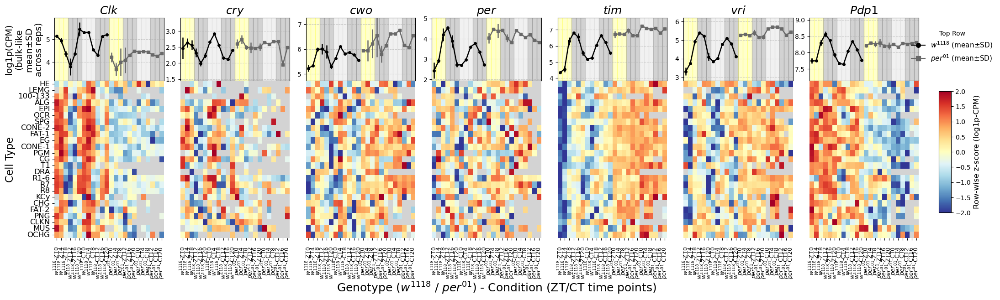

In [8]:
# ============================================================
# Combined figure
# - TOP: TRUE bulk-like per-replicate pseudo-bulk (pool->CPM->log1p),
#        plotted as mean +/- SD across replicates (WT/MT traces)
# - BOTTOM: Cell-type heatmaps with low-coverage masking + zero->NaN,
#           row-wise z-score (global per row) for WT/MT comparability
# ============================================================

import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from matplotlib.lines import Line2D
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

# ----------------------------
# USER SETTINGS
# ----------------------------
clock_genes = [
    # core set + a few outputs (edit as needed)
    'Clk','cry','cwo','per','tim','vri','Pdp1',
#    'Slob','Achl','NfI','dl','Zw','to','Gclc','ap','trpl','ninaA',
#    'Hk','Ih','Picot','hoe1','VAChT','Best1','Usp8','Pka-R1'
]

# Highlight these cell types on the first heatmap (optional)
desired_celltypes = [
    "FAT-1","FAT-2","HE","ALG","CHG",
    "PNG","SPG","CG","OCHG","EG","LEMG","CONE-1","CONE-2",
    "R1-6","R7","R8","CLKN","KCy","PGM","DRA","OCR","T1","EPI", "MUS",
    "100-133",
]

celltype_col   = 'all_celltype'      # in adata.obs
time_col       = 'final_Conditions'  # like "WT_ZT0_1", "MT_CT12_2"
layer          = 'counts'            # counts layer
scale_factor   = 1_000_000           # CPM scaling
exclude_times  = {'CT28'}            # drop unusual time bins if present

# Heatmap
vmin, vmax = -2, 2
cmap = sns.color_palette("RdYlBu_r", as_cmap=True)
cmap.set_bad('lightgray')

# Coverage/zeros handling
min_cells  = 20        # gray out (celltype,genotype,time) with < min_cells cells
zero_policy = 'na'     # 'na' => treat log1pCPM==0 as NaN before z-score
z_fill      = None     # None => keep NaN gray; or set 0 to draw neutral color

# ----------------------------
# HELPERS
# ----------------------------
def _extract_gt_time_rep(s):
    """Return genotype, time_point, replicate from a string like 'WT_ZT0_1'."""
    m_g = re.search(r'(WT|MT)', s)
    m_t = re.search(r'(ZT|CT)\d+', s)
    m_r = re.search(r'(?:ZT|CT)\d+_(\d+)', s)
    g = m_g.group(1) if m_g else np.nan
    t = m_t.group(0) if m_t else np.nan
    r = m_r.group(1) if m_r else None
    return g, t, r

def build_col_order_from_available(idx_multi, exclude_times=()):
    """
    Given MultiIndex cols (celltype, genotype, time), build order:
    [('WT','ZT0'),...,('WT','CT..'), then MT].
    """
    all_times = {i[2] for i in idx_multi}
    kept = [t for t in all_times if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)', s)
        grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    times_sorted = sorted(kept, key=keyfun)
    return [('WT', t) for t in times_sorted] + [('MT', t) for t in times_sorted]

def tuples_to_names(tuples):
    return [f"{g}_{t}" for (g, t) in tuples]

def parse_colname(cname):
    g, t = cname.split('_'); m = re.match(r'(ZT|CT)(\d+)', t)
    tt = m.group(1); hr = int(m.group(2)); return g, tt, hr

def shade_background(ax, colnames):
    for idx_c, cname in enumerate(colnames):
        g, tt, hr = parse_colname(cname)
        if tt == 'ZT':
            if 0 <= hr < 12: ax.axvspan(idx_c-0.5, idx_c+0.5, color='yellow', alpha=0.20)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)
        else:  # CT
            if 0 <= hr <= 8: ax.axvspan(idx_c-0.5, idx_c+0.5, color='lightgray', alpha=0.30)
            elif 8 < hr <= 20: ax.axvspan(idx_c-0.5, idx_c+0.5, color='gray', alpha=0.35)

def local_row_z(mat_df):
    mu = mat_df.mean(axis=1, skipna=True)
    sd = mat_df.std(axis=1, skipna=True).replace(0, np.nan)
    Z  = mat_df.sub(mu, axis=0).div(sd, axis=0)
    return Z

def slice_gene_heat_matrix(log1p_mat, gene, col_order):
    """rows=celltypes, cols=(genotype,time); values=log1pCPM"""
    s = log1p_mat.loc[gene]  # Series over (celltype, genotype, time)
    idx = log1p_mat.columns
    tmp = pd.DataFrame({
        'celltype':[i[0] for i in idx],
        'genotype':[i[1] for i in idx],
        'time_point':[i[2] for i in idx],
        'value':s.values
    })
    tmp['colkey'] = list(zip(tmp['genotype'], tmp['time_point']))
    heat = tmp.pivot(index='celltype', columns='colkey', values='value')
    heat = heat.reindex(columns=col_order)
    return heat

# ----------------------------
# CORE SUMMARIES
# ----------------------------
def pseudobulk_log1p_cpm(adata, genes, celltype_col, time_col, layer='counts',
                          scale_factor=1_000_000, exclude_times=()):
    """
    Per-(celltype, genotype, time): sum counts -> CPM -> log1p.
    Returns: DataFrame rows=genes, cols=MultiIndex(celltype, genotype, time)
    """
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    var = np.asarray(adata.var_names)

    # parse keys
    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    key_df = pd.DataFrame({celltype_col: adata.obs[celltype_col].values,
                           'genotype': gt, 'time_point': tp})
    valid = key_df['genotype'].notna() & key_df['time_point'].notna()
    if exclude_times: valid &= ~key_df['time_point'].isin(exclude_times)
    key_df = key_df.loc[valid]; X = X[valid.values, :]

    # group & sum
    grouped = key_df.groupby([celltype_col, 'genotype', 'time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in grouped.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    agg = pd.DataFrame(np.vstack(sums), columns=var,
                       index=pd.MultiIndex.from_tuples(cols, names=[celltype_col,'genotype','time_point'])).T

    genes_use = [g for g in genes if g in agg.index]
    agg = agg.loc[genes_use]

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

def bulk_like_log1p_cpm_by_rep(adata, layer, time_col, scale=1_000_000, exclude_times=()):
    """
    TRUE BULK per replicate: pool ALL cells per (genotype,time,rep) -> CPM -> log1p
    Returns: DataFrame genes x MultiIndex(genotype,time_point,replicate)
    """
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    genes = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    parsed = tser.apply(_extract_gt_time_rep)
    meta = pd.DataFrame(parsed.tolist(), columns=['genotype','time_point','replicate'])
    valid = meta['genotype'].notna() & meta['time_point'].notna()
    if exclude_times: valid &= ~meta['time_point'].isin(exclude_times)
    X = X[valid.values, :]; meta = meta.loc[valid]

    groups = meta.groupby(['genotype','time_point','replicate'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    if not sums:
        return pd.DataFrame(index=genes)

    agg = pd.DataFrame(np.vstack(sums), columns=genes,
                       index=pd.MultiIndex.from_tuples(cols, names=['genotype','time_point','replicate'])).T

    lib = agg.sum(axis=0); lib[lib==0]=1
    cpm = agg.div(lib, axis=1) * scale
    return np.log1p(cpm)

# ----------------------------
# BUILD MATRICES
# ----------------------------
# 1) For heatmaps (celltype,genotype,time)
log1p_mat = pseudobulk_log1p_cpm(
    adata, genes=clock_genes, celltype_col=celltype_col, time_col=time_col,
    layer=layer, scale_factor=scale_factor, exclude_times=exclude_times
)
col_order  = build_col_order_from_available(log1p_mat.columns, exclude_times=exclude_times)
colnames   = tuples_to_names(col_order)

# 2) For top row means/SDs (replicate-aware TRUE bulk)
bulk_by_rep = bulk_like_log1p_cpm_by_rep(
    adata, layer=layer, time_col=time_col, scale=scale_factor, exclude_times=exclude_times
)  # genes x (genotype,time,rep)

# Aggregate replicates -> mean & SD per (genotype,time)
if bulk_by_rep.shape[0] == 0:
    raise RuntimeError("No valid replicate groups found. Check time_col formatting like 'WT_ZT0_1'.")

means = bulk_by_rep.groupby(axis=1, level=['genotype','time_point']).mean()
sds   = bulk_by_rep.groupby(axis=1, level=['genotype','time_point']).std(ddof=1)

# Reindex to our display order and flatten names
mi = pd.MultiIndex.from_tuples(col_order, names=['genotype','time_point'])
means = means.reindex(columns=mi)
sds   = sds.reindex(columns=mi)
means.columns = colnames
sds.columns   = colnames

# ----------------------------
# CLUSTER ROW ORDER FOR HEATMAPS
# ----------------------------
# Build combined matrix across genes (row-wise z) for clustering
celltypes_all = sorted({i[0] for i in log1p_mat.columns})
mats = []
for g in clock_genes:
    H = slice_gene_heat_matrix(log1p_mat, g, col_order).reindex(celltypes_all)
    H_z = local_row_z(H)
    H_z.columns = pd.MultiIndex.from_product([[g], H_z.columns], names=['gene','colkey'])
    mats.append(H_z)
combined = pd.concat(mats, axis=1)
combined = combined.fillna(0.0)

row_dist = pdist(combined.values, metric='euclidean')
row_link = linkage(row_dist, method='average')
row_dend = dendrogram(row_link, no_plot=True)
ordered_celltypes = combined.index[row_dend['leaves']]

# ----------------------------
# COVERAGE (for masking)
# ----------------------------
obs = adata.obs[[celltype_col, time_col]].copy()
tser = obs[time_col].astype(str)
obs['genotype']   = tser.str.extract(r'(WT|MT)', expand=False)
obs['time_point'] = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)
valid = obs['genotype'].notna() & obs['time_point'].notna()
if exclude_times: valid &= ~obs['time_point'].isin(exclude_times)
obs = obs.loc[valid]

n_cells = obs.groupby([celltype_col, 'genotype', 'time_point'], observed=False).size()
cov_mat = (n_cells.rename('n').reset_index()
           .assign(colkey=lambda d: list(zip(d['genotype'], d['time_point'])))
           .pivot(index=celltype_col, columns='colkey', values='n'))
cov_mat = cov_mat.reindex(index=ordered_celltypes).reindex(columns=col_order)

# ----------------------------
# PLOTTING
# ----------------------------
n_genes = len(clock_genes)
fig = plt.figure(figsize=(22, 7))
gs = gridspec.GridSpec(nrows=2, ncols=n_genes, height_ratios=[1.0, 2.5])
gs.update(hspace=0.0, wspace=0.15)          # <- 0.0 here

axes_top  = [fig.add_subplot(gs[0, i]) for i in range(n_genes)]
axes_heat = [fig.add_subplot(gs[1, i]) for i in range(n_genes)]

# --- TOP: per-replicate bulk-like mean +/- SD ---
for i, gene in enumerate(clock_genes):
    ax = axes_top[i]
    shade_background(ax, colnames)

    if gene not in means.index:
        ax.set_axis_off(); continue

    vals = means.loc[gene].astype(float)
    errs = sds.loc[gene].astype(float)

    x = np.arange(len(colnames))
    wt_mask = [c.startswith('WT_') for c in colnames]
    mt_mask = [c.startswith('MT_') for c in colnames]

    ax.errorbar(x[wt_mask], vals[wt_mask], yerr=errs[wt_mask],
                fmt='o-', color='black', linewidth=1.8, markersize=4, label='WT (mean±SD)')
    ax.errorbar(x[mt_mask], vals[mt_mask], yerr=errs[mt_mask],
                fmt='s-', color='dimgray', linewidth=1.8, markersize=4, label='MT (mean±SD)')

    finite_vals = vals[np.isfinite(vals)]
    if len(finite_vals):
        ymin = float(finite_vals.min()) - 0.5
        ymax = float(finite_vals.max()) + 0.5
        if ymin == ymax: ymin -= 0.5; ymax += 0.5
        ax.set_ylim(ymin, ymax)

    ax.set_xlim(-0.5, len(colnames)-0.5)
    ax.grid(axis='y', linestyle='--', alpha=0.6)
    ax.set_title(f"$\\mathit{{{gene}}}$", fontsize=18)
    if i == 0:
        ax.set_ylabel("log1p(CPM)\n(bulk-like\nmean±SD\nacross reps)", fontsize=14)
    ax.set_xticks([]); ax.set_xticklabels([]); ax.set_xlabel("")

# One legend for the top row
fig.legend(
    handles=[
        Line2D([0],[0], marker='o', color='black',   label=r'$w^{1118}$ (mean±SD)', markersize=7, linestyle='-'),
        Line2D([0],[0], marker='s', color='dimgray', label=r'$per^{01}$ (mean±SD)', markersize=7, linestyle='-')
    ],
    loc='upper right', ncol=1, fontsize=11, title="Top Row", bbox_to_anchor=(1, 0.85), frameon=False 
)

# --- BOTTOM: heatmaps with masking + zero policy ---
# --- BOTTOM: heatmaps with masking + zero policy ---
for i, gene in enumerate(clock_genes):
    ax = axes_heat[i]
    if gene not in log1p_mat.index:
        ax.set_axis_off()
        continue

    # 1) Slice absolute log1p(CPM) and restrict to selected rows (preserve dendrogram order)
    selected = [ct for ct in ordered_celltypes if ct in set(desired_celltypes)]
    heat_abs = slice_gene_heat_matrix(log1p_mat, gene, col_order).reindex(selected)

    # 2) Use coverage matrix restricted to the same selection, then mask low-coverage cells
    cov_sub = cov_mat.reindex(index=selected)
    low_mask = cov_sub < min_cells
    heat_abs = heat_abs.mask(low_mask)

    # 3) Apply zero->NaN policy (if requested) *before* z-scoring
    if zero_policy == 'na':
        heat_abs = heat_abs.where(heat_abs != 0, np.nan)

    # 4) Row-wise z for WT/MT comparability
    heat_z = local_row_z(heat_abs)

    # 5) Plot
    sns.heatmap(
        heat_z, ax=ax, cmap=cmap, center=0, vmin=vmin, vmax=vmax,
        cbar=False, xticklabels=True, yticklabels=(True if i == 0 else False),
        linewidths=0, linecolor=None
    )
    if i == 0:
        ax.set_facecolor("white")
        ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
        ax.set_ylabel("Cell Type", fontsize=16)
    else:
        ax.set_ylabel("")

    ax.set_title("")
    ax.set_xlabel("")
    ax.set_xlim(0, len(col_order))
    ax.grid(False)

    # Pretty x tick labels with mathtext for genotypes
    ax.set_xticks(np.arange(len(col_order)) + 0.5)
    xticklabels = []
    for g,t in col_order:
        tag = f"{g}_{t}"
        if tag.startswith("WT_"): xticklabels.append(tag.replace("WT_", r"$w^{1118}$-"))
        elif tag.startswith("MT_"): xticklabels.append(tag.replace("MT_", r"$per^{01}$-"))
        else: xticklabels.append(tag)
    ax.set_xticklabels(xticklabels, rotation=90, ha='center', fontsize=9)
    ax.tick_params(axis='x', pad=10)

# Highlight selected cell types
highlight = set(desired_celltypes)
ax0 = axes_heat[0]
for tick in ax0.get_yticklabels():
    lbl = tick.get_text()
    if lbl in highlight:
        tick.set_color('black')
        #tick.set_fontweight('bold')

# Shared x-label + colorbar
fig.supxlabel(r"Genotype ($w^{1118}$ / $per^{01}$) - Condition (ZT/CT time points)", fontsize=18, y=0.00)

sm = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax), cmap=cmap)
sm.set_array([])
cbar_ax = fig.add_axes([0.94, 0.26, 0.012, 0.38])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label("Row-wise z-score (log1p-CPM)", fontsize=12)

plt.subplots_adjust(left=0.06, right=0.92, bottom=0.18, top=0.87, wspace=0.15, hspace=0) #right = 0.95
plt.show()

In [39]:
import re, warnings
import numpy as np
import pandas as pd
import scipy.sparse as sp
from scipy.stats import pearsonr
from numpy import isfinite

# ----------------------------
# Inputs
# ----------------------------
rhythmic_csv_path = "/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/WTLD_WTDD_notMTDD_genes.csv"
clock_genes_request = ["Clk","cry","per","tim","cwo","Pdp1","vri"]
selected_celltypes = ["FAT-1","FAT-2","HE","ALG","CHG","PNG","SPG","CG","EG","LEMG",
                      "CONE-1","CONE-2","R1-6","R7","R8","CLKN","KCy","PGM","DRA","OCR","T1","EPI"]
celltype_col  = "all_celltype"
time_col      = "final_Conditions"   # e.g., "WT_ZT0_1", "MT_CT12_2"
counts_layer  = "counts"
scale_factor  = 1_000_000
exclude_times = {"CT28"}  # optional
min_overlap   = 6         # minimum overlapping points for a correlation

# ----------------------------
# Small helpers
# ----------------------------
def build_col_order_from_available(idx_multi, exclude_times=()):
    all_times = {i[2] for i in idx_multi}
    kept = [t for t in all_times if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)', s); grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    times_sorted = sorted(kept, key=keyfun)
    return [('WT', t) for t in times_sorted] + [('MT', t) for t in times_sorted]

def pseudobulk_log1p_cpm(adata, genes, celltype_col, time_col, layer='counts',
                         scale_factor=1_000_000, exclude_times=()):
    """rows=genes, cols=MultiIndex(celltype, genotype, time_point) of log1p-CPM."""
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    var = np.asarray(adata.var_names)

    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    key_df = pd.DataFrame({celltype_col: adata.obs[celltype_col].astype(str).values,
                           'genotype': gt, 'time_point': tp})
    valid = key_df['genotype'].notna() & key_df['time_point'].notna()
    if exclude_times: valid &= ~key_df['time_point'].isin(exclude_times)
    key_df = key_df.loc[valid]; X = X[valid.values, :]

    groups = key_df.groupby([celltype_col, 'genotype', 'time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)

    agg = pd.DataFrame(np.vstack(sums), columns=var,
                       index=pd.MultiIndex.from_tuples(cols, names=[celltype_col,'genotype','time_point'])).T

    genes_use = [g for g in genes if g in agg.index]
    if not genes_use:
        raise RuntimeError("None of the requested genes found in adata.var_names.")
    agg = agg.loc[genes_use]

    lib = agg.sum(axis=0); lib[lib==0] = 1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

def safe_corr(a, b, min_overlap=6):
    """Pearson r on overlap, skip if constant/too short."""
    if a is None or b is None:
        return np.nan
    mask = a.notna() & b.notna()
    if mask.sum() < min_overlap:
        return np.nan
    aa = a[mask].astype(float).values
    bb = b[mask].astype(float).values
    if np.nanstd(aa) == 0 or np.nanstd(bb) == 0:
        return np.nan
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        r, _ = pearsonr(aa, bb)
    return r if np.isfinite(r) else np.nan

# ----------------------------
# 1) Load rhythmic list + prepare gene sets
# ----------------------------
rhyth = pd.read_csv(rhythmic_csv_path)
rhythmic_genes = set(rhyth['CycID'].astype(str))

# normalize clock names; also build case-insensitive blocklist
alias_map = {"Pdp-1":"Pdp1", "pdp-1":"Pdp1"}
clock_genes = [alias_map.get(g, g) for g in clock_genes_request]
clock_gene_set = set(clock_genes)
clock_gene_set_lower = {g.lower() for g in clock_genes}

# we compute patterns for rhythmic + clocks (clocks needed as references)
genes_for_matrix = sorted(rhythmic_genes.union(clock_gene_set))

# ----------------------------
# 2) Build pseudobulk matrix and normalize its column index
# ----------------------------
PB = pseudobulk_log1p_cpm(
    adata, genes_for_matrix, celltype_col=celltype_col, time_col=time_col,
    layer=counts_layer, scale_factor=scale_factor, exclude_times=exclude_times
)

# ensure column MultiIndex is (celltype, genotype, time_point) exactly
need_names = [celltype_col, 'genotype', 'time_point']
if list(PB.columns.names) != need_names:
    # try to reorder by name
    name_to_pos = {n:i for i,n in enumerate(PB.columns.names)}
    order = [name_to_pos.get(n, i) for i,n in enumerate(need_names)]
    PB.columns = PB.columns.reorder_levels(order)
    PB.columns.set_names(need_names, inplace=True)

# limit to selected cell types actually present
cts_present = [ct for ct in selected_celltypes if ct in PB.columns.get_level_values(celltype_col).unique()]
if not cts_present:
    raise RuntimeError("None of the selected cell types are present in PB.")

# column (genotype,time) order inside each cell type
gt_time_order = build_col_order_from_available(PB.columns, exclude_times=exclude_times)

# full ordered list of positions across selected cell types
global_positions = []
colset = set(PB.columns.tolist())
for ct in cts_present:
    for (g, t) in gt_time_order:
        key = (ct, g, t)
        if key in colset:
            global_positions.append(key)

# ----------------------------
# 3) Build global pattern vectors (z-score within each CT block)
# ----------------------------
def global_pattern_vector(gene, frame, positions, ct_list):
    if gene not in frame.index:
        return None
    s = frame.loc[gene]  # Series over (celltype, genotype, time_point)
    pieces = []
    for ct in ct_list:
        keys_ct = [k for k in positions if k[0] == ct]
        if not keys_ct:
            continue
        v = s.reindex(keys_ct).astype(float)     # keep order
        valid = v.notna()
        if valid.sum() < 2:
            pieces.append(pd.Series(np.nan, index=v.index))
            continue
        m = v[valid].mean(); sd = v[valid].std()
        if not (isfinite(m) and isfinite(sd) and sd > 0):
            pieces.append(pd.Series(np.nan, index=v.index))
            continue
        pieces.append((v - m) / sd)
    if not pieces:
        return None
    vec = pd.concat(pieces)
    vec.name = gene
    return vec

vectors = {g: global_pattern_vector(g, PB, global_positions, cts_present) for g in genes_for_matrix}

# ----------------------------
# 4) Compute top-5 with GLOBAL DE-DUPLICATION of candidate genes
# ----------------------------
candidate_genes = [g for g in rhythmic_genes if (g in vectors) and (g.lower() not in clock_gene_set_lower)]

rows = []
used_globally = set()  # prevent duplicates across all clock genes

for cg in clock_genes:
    v_cg = vectors.get(cg)
    if v_cg is None:
        continue

    # score all remaining candidates (exclude those already used)
    scores = []
    for g in candidate_genes:
        if g in used_globally:
            continue
        r = safe_corr(v_cg, vectors.get(g), min_overlap=min_overlap)
        if isfinite(r):
            scores.append((g, r))

    if not scores:
        # no available candidates left
        rows.append({
            "clock_gene": cg,
            **{f"top{i}_gene": "" for i in range(1, 6)},
            **{f"top{i}_r": np.nan for i in range(1, 6)},
            "n_positions_used_by_clock": int(v_cg.notna().sum()),
            "n_positions_possible": len(global_positions)
        })
        continue

    # Sort by correlation descending
    scores.sort(key=lambda x: x[1], reverse=True)

    # Pick up to five unique candidates, marking them as used
    picks = []
    for g, r in scores:
        if g not in used_globally:
            picks.append((g, r))
            used_globally.add(g)
        if len(picks) == 5:
            break

    # Pad with blanks if fewer than 5
    while len(picks) < 5:
        picks.append(("", np.nan))

    # Build result row
    row = {
        "clock_gene": cg,
        "n_positions_used_by_clock": int(v_cg.notna().sum()),
        "n_positions_possible": len(global_positions)
    }
    for i, (gene_name, r_val) in enumerate(picks, start=1):
        row[f"top{i}_gene"] = gene_name
        row[f"top{i}_r"] = r_val

    rows.append(row)

# Final dataframe
top5_global = pd.DataFrame(rows).sort_values("clock_gene").reset_index(drop=True)
top5_global

,clock_gene,n_positions_used_by_clock,n_positions_possible,top1_gene,top1_r,top2_gene,top2_r,top3_gene,top3_r,top4_gene,top4_r,top5_gene,top5_r
0,Clk,528,528,kdn,0.375592,Hs6st,0.362099,CG32369,0.350663,Rtnl1,0.345168,Dyb,0.336880
1,Pdp1,528,528,Sfp33A3,0.196595,snoRNA:CD75,0.151543,lncRNA:CR44470,0.146653,CG18302,0.126944,CG31704,0.120775
2,cry,528,528,eRF3,0.321748,lncRNA:CR43314,0.312354,CG4577,0.288643,Fs,0.286081,Cpr73D,0.273672
3,cwo,528,528,bbc,0.173094,Mef2,0.164185,Gp210,0.152458,mt:lrRNA,0.146904,Rh6,0.140220
4,per,528,528,gol,0.295478,Dyrk2,0.241660,mt:srRNA,0.239682,Rim2,0.232104,CG31324,0.224581
5,tim,528,528,trpl,0.282059,CG15414,0.245780,trp,0.208721,CG32647,0.156261,CG46385,0.126195
6,vri,528,528,exp,0.144653,CG8468,0.133401,Moe,0.112709,CG31100,0.112516,CG13041,0.111252


In [40]:
print(top5_global)

  clock_gene  n_positions_used_by_clock  n_positions_possible top1_gene  \
0        Clk                        528                   528       kdn   
1       Pdp1                        528                   528   Sfp33A3   
2        cry                        528                   528      eRF3   
3        cwo                        528                   528       bbc   
4        per                        528                   528       gol   
5        tim                        528                   528      trpl   
6        vri                        528                   528       exp   

     top1_r       top2_gene    top2_r       top3_gene    top3_r top4_gene  \
0  0.375592           Hs6st  0.362099         CG32369  0.350663     Rtnl1   
1  0.196595     snoRNA:CD75  0.151543  lncRNA:CR44470  0.146653   CG18302   
2  0.321748  lncRNA:CR43314  0.312354          CG4577  0.288643        Fs   
3  0.173094            Mef2  0.164185           Gp210  0.152458  mt:lrRNA   
4  0.295478   

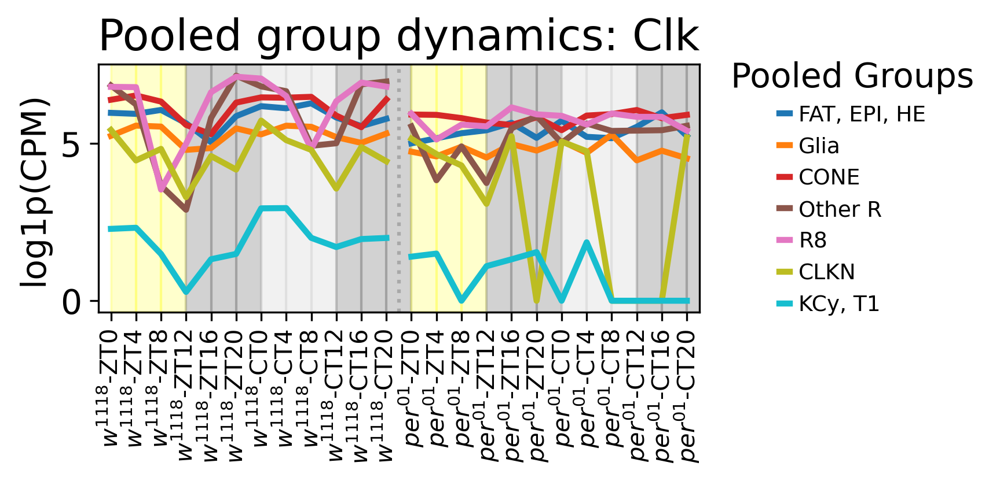

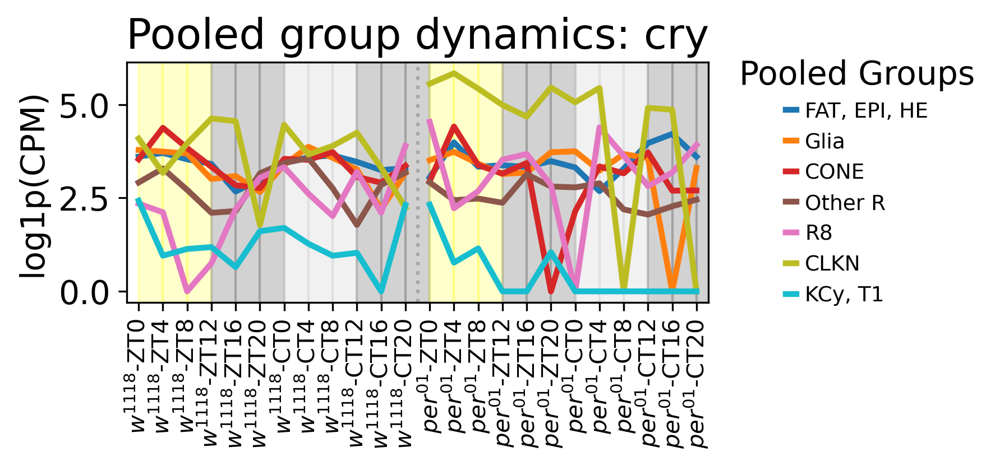

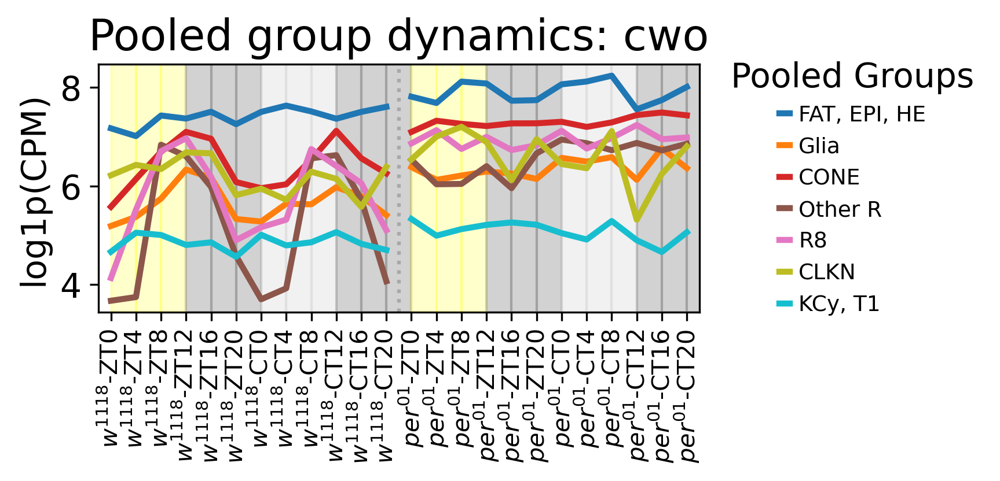

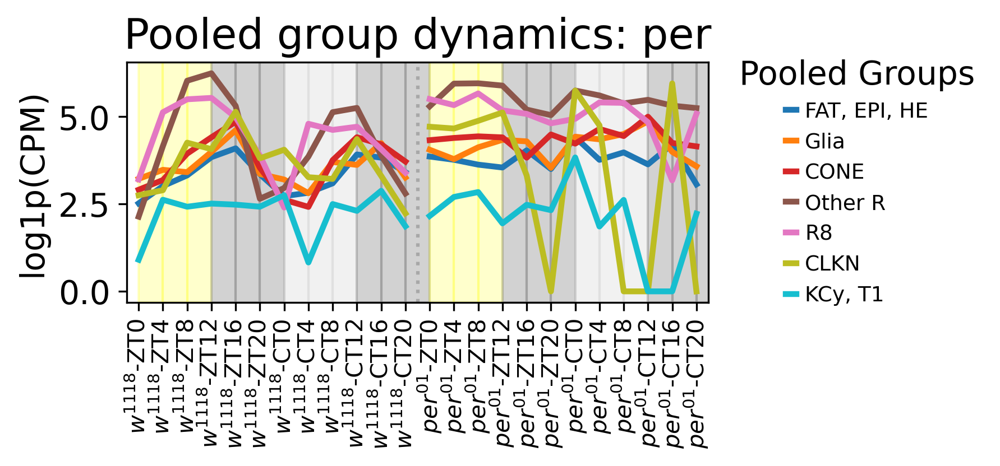

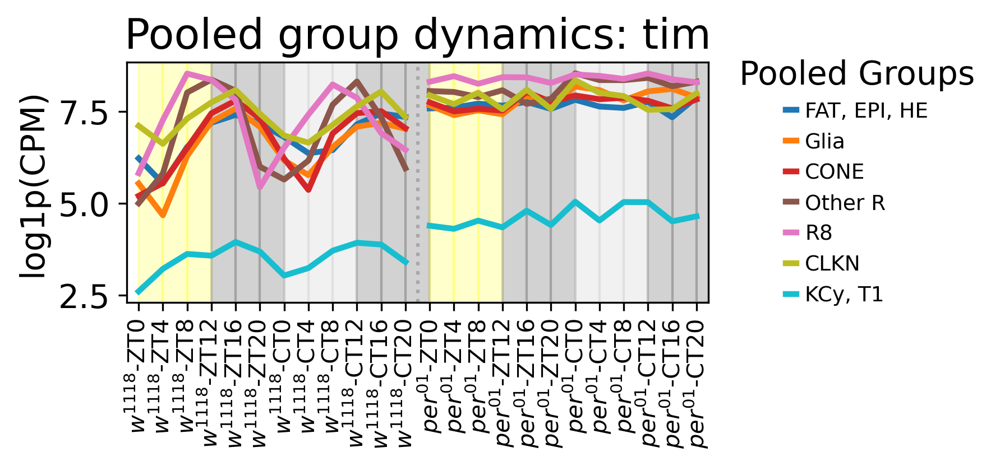

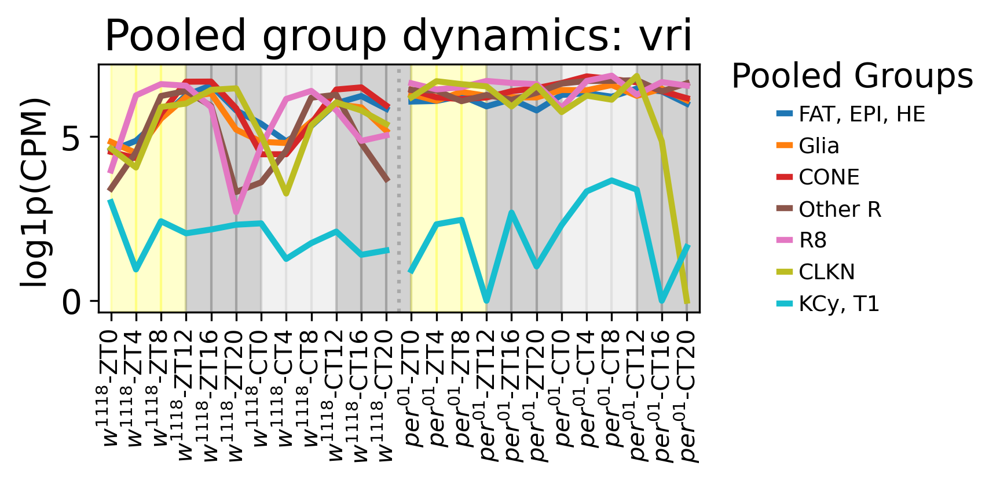

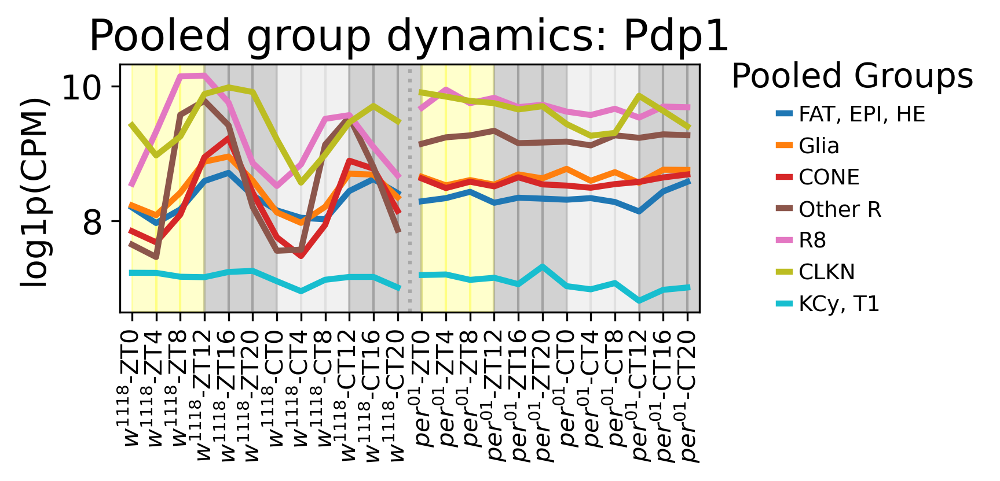

In [47]:
# ============================================================
# Group-pooled single-cycle traces with WT/MT overlay
# - Pools counts across grouped cell types -> CPM -> log1p
# - One x-axis cycle (ZT...CT) shown once
# - WT and MT drawn as solid lines over the same x positions
# - Day/Night shading applied across the single cycle
# - No grid lines
# - Robust parsing + no colormap deprecation warnings
# ============================================================

import re
import numpy as np
import pandas as pd
import scipy.sparse as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ----------------------------
# USER SETTINGS
# ----------------------------
clock_genes = [
    'Clk','cry','cwo','per','tim','vri','Pdp1',
    # add more if you like ...
]

# Group definitions (pooled)
from collections import OrderedDict
grouped_celltypes = OrderedDict([
    ("FAT, EPI, HE",  ["FAT-1","FAT-2","EPI","HE"]),
    ("Glia",          ["ALG","CHG","PNG","SPG","CG","EG","LEMG","PGM"]),
    ("CONE",          ["CONE-1","CONE-2"]),
    ("Other R",       ["DRA","OCR","R1-6","R7"]),
    #("R1-6, R7",      ["R1-6","R7"]),
    #("Other R",       ["DRA","OCR"]),
    ("R8",            ["R8"]),
    ("CLKN",          ["CLKN"]),
    ("KCy, T1",       ["KCy","T1"]),
])

celltype_col   = 'all_celltype'      # in adata.obs
time_col       = 'final_Conditions'  # e.g. "WT_ZT0_1", "MT_CT12_2"
layer          = 'counts'            # counts layer
scale_factor   = 1_000_000           # CPM scaling
exclude_times  = {'CT28'}            # drop unusual bins if present
figsize        = (6, 3)
lw             = 2.5                 # line width
alpha_mt       = 0.8                 # slightly translucent MT for visibility; set to 1.0 if unwanted

# Colors (one color per GROUP; consistent across genes)
# consistent colors per GROUP
group_names = list(grouped_celltypes.keys())
group_cmap = mpl.colormaps["tab10"]       # get the colormap (no N argument here)
group_colors = {g: group_cmap(i / max(1, len(group_names)-1))
                for i, g in enumerate(group_names)}


# ----------------------------
# HELPERS
# ----------------------------
def parse_colname(cname):
    """
    Accepts 'WT_ZT0', 'MT_CT12', or just 'ZT0'/'CT12'.
    Returns (genotype or None, 'ZT'|'CT' or None, hour or None).
    """
    m = re.match(r'(?:(WT|MT)_)?(ZT|CT)(\d+)$', str(cname))
    if not m:
        return None, None, None
    g, tt, hr = m.group(1), m.group(2), int(m.group(3))
    return g, tt, hr

def shade_background(ax, colnames):
    """
    Apply yellow/gray shading behind ticks in a single cycle list like ['ZT0','ZT2',...,'CT20'] 
    or a combined list like ['WT_ZT0', ...] etc. Uses parse_colname.
    """
    for idx_c, cname in enumerate(colnames):
        g, tt, hr = parse_colname(cname)
        if tt is None or hr is None:
            continue
        if tt == 'ZT':
            if 0 <= hr < 12:
                ax.axvspan(idx_c-0, idx_c+1, color='yellow', alpha=0.20)
            elif 8 < hr <= 20:
                ax.axvspan(idx_c-0, idx_c+1, color='gray', alpha=0.35)
        else:  # CT
            if 0 <= hr <= 8:
                ax.axvspan(idx_c-0, idx_c+1, color='lightgray', alpha=0.30)
            elif 8 < hr <= 20:
                ax.axvspan(idx_c-0, idx_c+1, color='gray', alpha=0.35)

def get_times_in_order(adata, time_col, exclude_times=()):
    """
    Extract available ZT/CT bins from adata.obs[time_col], return a single-cycle
    list like ['ZT0','ZT2',...,'CT20'] sorted with ZT first, then CT.
    """
    tser = adata.obs[time_col].astype(str)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False).dropna().unique().tolist()
    if exclude_times:
        tp = [t for t in tp if t not in set(exclude_times)]
    def keyfun(s):
        m = re.match(r'(ZT|CT)(\d+)$', s)
        grp = m.group(1); hr = int(m.group(2))
        return (0 if grp=='ZT' else 1, hr)
    return sorted(tp, key=keyfun)

# ----------------------------
# CORE: grouped pseudobulk CPM -> log1p
# ----------------------------
def grouped_pseudobulk_log1p_cpm(
    adata, groups_map, celltype_col, time_col, layer='counts',
    scale_factor=1_000_000, exclude_times=()
):
    X = adata.layers[layer] if layer in adata.layers else adata.X
    if sp.issparse(X): X = X.tocsr()
    genes = np.asarray(adata.var_names)

    # parse genotype/time from time_col
    tser = adata.obs[time_col].astype(str)
    gt = tser.str.extract(r'(WT|MT)', expand=False)
    tp = tser.str.extract(r'((?:ZT|CT)\d+)', expand=False)

    # map cell types -> group (drop cells not in any group)
    ct = adata.obs[celltype_col].astype(str)
    ct2grp = {}
    for gname, members in groups_map.items():
        for m in members:
            ct2grp[m] = gname
    grp = ct.map(ct2grp)

    meta = pd.DataFrame({
        'group': grp,
        'genotype': gt,
        'time_point': tp,
    })
    valid = meta['group'].notna() & meta['genotype'].notna() & meta['time_point'].notna()
    if exclude_times:
        valid &= ~meta['time_point'].isin(exclude_times)

    meta = meta.loc[valid]
    X = X[valid.values, :]

    # sum counts per (group, genotype, time)
    groups = meta.groupby(['group','genotype','time_point'], observed=False).indices
    cols, sums = [], []
    for key, idxs in groups.items():
        s = np.asarray(X[idxs].sum(axis=0)).ravel()
        cols.append(key); sums.append(s)
    if not sums:
        return pd.DataFrame(index=genes)

    agg = pd.DataFrame(
        np.vstack(sums), columns=genes,
        index=pd.MultiIndex.from_tuples(cols, names=['group','genotype','time_point'])
    ).T

    lib = agg.sum(axis=0); lib[lib==0] = 1
    cpm = agg.div(lib, axis=1) * scale_factor
    return np.log1p(cpm)

# ----------------------------
# BUILD DATA
# ----------------------------
# Single-cycle time axis in order (ZT first, then CT)
times_in_order = get_times_in_order(adata, time_col, exclude_times=exclude_times)   # ['ZT0','ZT2',..,'CT20']
x = np.arange(len(times_in_order))                                                   # single cycle

# Pooled grouped matrix: genes x MultiIndex(group, genotype, time)
group_log1p = grouped_pseudobulk_log1p_cpm(
    adata,
    groups_map=grouped_celltypes,
    celltype_col=celltype_col,
    time_col=time_col,
    layer=layer,
    scale_factor=scale_factor,
    exclude_times=exclude_times
)

## ============================================
# 3) Line plots per gene (WT block left, MT block right; shading on both)
# ============================================

# Build WT→MT label order that matches the two-block x-axis
times_in_order = get_times_in_order(adata, time_col, exclude_times=exclude_times)  # e.g., ['ZT0','ZT2',...,'CT20']
nT = len(times_in_order)
xticklabels = [f"WT_{t}" for t in times_in_order] + [f"MT_{t}" for t in times_in_order]

# Optional: if you haven't already fixed colormap deprecation
group_names = list(grouped_celltypes.keys())
group_cmap = mpl.colormaps["tab10"]
group_colors = {g: group_cmap(i / max(1, len(group_names)-1)) for i, g in enumerate(group_names)}

# Build raw column names ONCE (keep them immutable for shading)
raw_cols = [f"WT_{t}" for t in times_in_order] + [f"MT_{t}" for t in times_in_order]

for gene in clock_genes:
    if gene not in group_log1p.index:
        continue

    fig, ax = plt.subplots(figsize=figsize)

    # Use RAW labels for shading so parse_colname() works
    shade_background(ax, raw_cols)

    # x positions
    nT = len(times_in_order)
    wt_x = np.arange(nT)
    mt_x = np.arange(nT, 2*nT)

    for gname in group_names:
        y_wt = [float(group_log1p.loc[gene, (gname, 'WT', t)])
                if (gname, 'WT', t) in group_log1p.columns else np.nan
                for t in times_in_order]
        y_mt = [float(group_log1p.loc[gene, (gname, 'MT', t)])
                if (gname, 'MT', t) in group_log1p.columns else np.nan
                for t in times_in_order]

        ax.plot(wt_x, y_wt, color=group_colors[gname], linewidth=lw, label=gname)
        ax.plot(mt_x, y_mt, color=group_colors[gname], linewidth=lw)

    # Pretty tick labels kept in a SEPARATE list (don't overwrite raw_cols)
    pretty_labels = ([f"$w^{{1118}}$-{t}" for t in times_in_order] +
                     [f"$per^{{01}}$-{t}" for t in times_in_order])
    ax.set_xticks(np.arange(2 * nT))
    ax.set_xticklabels(pretty_labels, rotation=90, fontsize=10)

    ax.set_xlim(-0.5, 2*nT - 0.5)
    ax.set_ylabel("log1p(CPM)", fontsize=14)
    ax.set_title(f"Pooled group dynamics: {gene}", fontsize=18)

    ax.grid(False)
    ax.axvline(nT - 0.5, color='k', alpha=0.2, linestyle=':')

    ax.legend(loc='center left', bbox_to_anchor=(1.02, 0.5),
              fontsize=9, title="Pooled Groups", frameon=False)

    plt.tight_layout()
    plt.show()
